#1. Import Dataset

In [1]:
import tensorflow as tf


In [2]:
from google.colab import drive
import numpy as np
import pandas as pd


drive.mount('/content/drive/', force_remount=True)

dir = '/content/drive/My Drive/TA/'
import sys
sys.path.insert(0, dir)


import scipy.optimize
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import time
import warnings
from CombinedDecays import CombinedDecays
import datetime


Mounted at /content/drive/


In [3]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    for gpu in gpus:
      print(f"Found GPU: {gpu.name}")
  except RuntimeError as e:
    print(e)
else:
  print("No GPU devices found.")

Found GPU: /physical_device:GPU:0


In [ ]:
df = pd.read_csv("/content/drive/My Drive/TA/Dataset/Localized/CO_Land_Grid_Jabodetabek.csv")
wind = pd.read_csv("/content/drive/My Drive/TA/Dataset/Localized/Wind_CO_MeanDaily_Jabodetabek.csv")


In [ ]:
# no2_df = pd.read_csv("/content/drive/MyDrive/TA/Dataset/no2.csv")
# wind_df=  pd.read_csv("/content/drive/MyDrive/TA/Dataset/wind.csv")
# no2_sea = pd.read_csv("/content/drive/MyDrive/TA/Dataset/Sea/NO2_Sea_wind.csv")

#2. Class Definition

In [4]:
import tensorflow as tf
import numpy as np
import scipy.optimize
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import time
import warnings

DTYPE='float32'

class MultiSigmaFourierFeatures(tf.keras.layers.Layer):
    def __init__(self, sigmas, mapping_size, trainable_B=False, **kwargs):
        super().__init__(**kwargs)
        self.sigmas = sigmas
        self.mapping_size = mapping_size
        self.trainable_B = trainable_B
        self.fourier_layers = [
            FourierFeatureMapping(
                mapping_size=self.mapping_size,
                sigma=sigma,
                trainable_B=self.trainable_B
            ) for sigma in self.sigmas
        ]

    def call(self, inputs):
        outputs = [layer(inputs) for layer in self.fourier_layers]
        return tf.concat(outputs, axis=-1)



class FourierFeatureMapping(tf.keras.layers.Layer):
    def __init__(self, mapping_size=256, sigma=1.0, trainable_B=False, **kwargs):
        super(FourierFeatureMapping, self).__init__(**kwargs)
        self.mapping_size = mapping_size
        self.sigma = sigma
        self.trainable_B = trainable_B

    def build(self, input_shape):
        input_dim = input_shape[-1]
        # Use RandomNormal initializer with stddev = sigma
        self.B = self.add_weight(
            name="B_matrix",
            shape=(input_dim, self.mapping_size),
            initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=self.sigma),
            trainable=self.trainable_B
        )

    def call(self, inputs):
        proj = tf.matmul(inputs, self.B)
        return tf.concat([tf.sin(proj), tf.cos(proj)], axis=-1)

    def get_config(self):
        config = super().get_config()
        config.update({
            "mapping_size": self.mapping_size,
            "sigma": self.sigma,
            "trainable_B": self.trainable_B
        })
        return config

# Define model architecture for 2D spatial domain with time
class PINN_NeuralNet(tf.keras.Model):
    def __init__(self, lb, ub,
                 output_dim=1,
                 num_hidden_layers=8,
                 num_neurons_per_layer=20,
                 activation='swish',
                 mapping_size=256,
                 sigma=1.0,
                 sigmas=[1.0, 3.0],
                 kernel_initializer='glorot_normal',
                 trainable_B=True,
                 **kwargs):
        super().__init__(**kwargs)
        self.lb = lb
        self.ub = ub
        self.num_hidden_layers = num_hidden_layers
        self.output_dim = output_dim
        self.mapping_size = mapping_size
        self.trainable_B = trainable_B
        self.sigmas = sigmas
        self.scale = tf.keras.layers.Lambda(lambda x: 2.0*(x - lb)/(ub - lb) - 1.0)
        self.fourier_features = MultiSigmaFourierFeatures(sigmas=self.sigmas, mapping_size=self.mapping_size, trainable_B=True)
        # self.fourier_features = FourierFeatureMapping(mapping_size=mapping_size, sigma=sigma, trainable_B=trainable_B)

        # dummy_input = tf.keras.Input(shape=(3,))
        # _ = self.fourier_features(dummy_input)

        self.hidden = [tf.keras.layers.Dense(num_neurons_per_layer,
                                             activation=tf.keras.activations.get(activation),
                                             kernel_initializer=kernel_initializer)
                       for _ in range(self.num_hidden_layers)]
        self.out = tf.keras.layers.Dense(output_dim, activation = "softplus")


    def call(self, X):
        """Forward-pass through neural network."""
        X = tf.convert_to_tensor(X, dtype=tf.float32)  # Ensure X is a Tensor
        X = tf.reshape(X, (-1, 3))  # Ensure input is 2D (batch_size, features) for [t, x, y]
        Z = self.scale(X)
        Z = self.fourier_features(Z)
        for i in range(self.num_hidden_layers):
            Z = self.hidden[i](Z)
        return self.out(Z)


class PINN_PDESolver():
    def __init__(self, model, X_r, fun_r, get_r,lambd=1):
        self.model = model

        # Store collocation points
        # X_r = tf.convert_to_tensor(X_r, dtype=tf.float32)  # Ensure X_r is a Tensor
        self.t = X_r[:,0:1]
        self.x = X_r[:,1:2]
        self.y = X_r[:,2:3]
        self.lambd = lambd
        # Initialize history of losses and global iteration counter
        self.hist = []
        self.lambd_list = []  # Initialize lambda list here
        self.iter = 0
        self.fun_r = fun_r
        self.get_r_fn = get_r

    def get_r(self, t, x, y, u_data, Wu=None, Wv=None): # Added default None for Wu, Wv
        return self.get_r_fn(t=t, x=x, y=y, model=self.model, lambd = self.lambd, fun_r=self.fun_r, u_data=u_data, Wu=Wu, Wv=Wv)


    def loss_fn(self, X, u, Wu, Wv):
        # X = tf.convert_to_tensor(X, dtype=tf.float32)
        # X = tf.reshape(X, (-1, 3))  # Ensure input is 3D [t, x, y]
        # u = tf.convert_to_tensor(u, dtype=tf.float32)

        # Compute phi_r
        t = X[:, 0:1]
        x = X[:, 1:2]
        y = X[:, 2:3]
        r = self.get_r(t, x, y, u, Wu, Wv)
        phi_r = r

        # Initialize loss
        loss = phi_r

        return loss, phi_r
    @tf.function
    def get_grad(self, X, u, Wu, Wv):
        X = tf.cast(X, tf.float32)
        u = tf.cast(u, tf.float32)
        Wu = tf.cast(Wu, tf.float32)
        Wv = tf.cast(Wv, tf.float32)


        with tf.GradientTape() as tape:
            loss, phi_r = self.loss_fn(X, u, Wu, Wv)
        grad_theta = tape.gradient(loss, self.model.trainable_variables)

        return loss, grad_theta

    def solve_with_TFoptimizer(self, optimizer, X, u, W_u, W_v, inverse=True, N=None, min_loss=None, timeout=None, batch_size=None):
        """
        Modified training loop that keeps the loss_callback function and reports loss per iteration.
        """
        X = tf.convert_to_tensor(X, dtype=tf.float32)
        u = tf.convert_to_tensor(u, dtype=tf.float32)
        W_u = tf.convert_to_tensor(W_u, dtype=tf.float32)
        W_v = tf.convert_to_tensor(W_v, dtype=tf.float32)


        data = tf.data.Dataset.from_tensor_slices((X, u, W_u, W_v))

        if batch_size is not None:
            data = data.shuffle(buffer_size=len(X)).batch(batch_size).map(
                lambda x, u_batch, wu, wv: (tf.cast(x, tf.float32), tf.cast(u_batch, tf.float32), tf.cast(wu, tf.float32), tf.cast(wv, tf.float32))
            ).prefetch(tf.data.AUTOTUNE)
        else:
            data = data.batch(len(X)).map(
                lambda x, u_batch, wu, wv: (tf.cast(x, tf.float32), tf.cast(u_batch, tf.float32), tf.cast(wu, tf.float32), tf.cast(wv, tf.float32))
            ).prefetch(tf.data.AUTOTUNE)


        # The loss_callback now accepts the results of a step as arguments.
        def loss_callback(loss, phi_r, epoch_num):
            self.current_loss = loss.numpy()
            self.phi_r = phi_r.numpy()

            # Print every 50 iterations to avoid excessive output
            if self.iter % 50 == 0:
                print(f"Epoch {epoch_num}, Iteration {self.iter}, Loss: {self.current_loss:.6e}, Phi_r: {self.phi_r:.6e}")

            self.hist.append(self.current_loss)
            self.iter += 1

        start_time = time.time()
        epochs = N if N is not None else 1000 # Set a default number of epochs if N isn't specified

        # Explicit loops for epochs and iterations (batches)
        for epoch in range(epochs):
            if timeout is not None and (time.time() - start_time > timeout):
                print("Timeout reached. Stopping training.")
                break

            total_epoch_loss = 0
            num_batches = 0
            for batch_X, batch_u, batch_Wu, batch_Wv in data:
                # Execute one training step (one batch)
                loss, grads = self.get_grad(batch_X, batch_u, batch_Wu, batch_Wv)
                optimizer.apply_gradients(zip(grads, self.model.trainable_variables))

                # Accumulate loss for the epoch
                total_epoch_loss += loss.numpy()
                num_batches += 1

                # Recalculate phi_r for reporting (optional, can be removed for speed)
                # phi_r = self.loss_fn(batch_X, batch_u, batch_Wu, batch_Wv)[1]
                # loss_callback(loss, phi_r, epoch + 1) # Callback per batch (noisy)

            # Calculate average epoch loss and call callback once per epoch
            avg_epoch_loss = total_epoch_loss / num_batches if num_batches > 0 else 0
            # We don't have phi_r readily available as it's calculated per batch,
            # so we'll just report the average epoch loss.
            self.current_loss = avg_epoch_loss
            self.hist.append(self.current_loss)
            self.iter += 1 # Increment iteration counter once per epoch

            # Print every epoch
            print(f"--- End of Epoch {epoch+1}, Iteration {self.iter}, Average Epoch Loss: {self.current_loss:.6e} ---")


            if min_loss is not None and self.current_loss < min_loss:
                print(f"Minimum loss of {min_loss} reached. Stopping training.")
                break


    def callback(self, xr=None):
        if self.iter % 50 == 0:
            print('It {:05d}: l_u = {:10.8e} loss = {:10.8e}'.format(self.iter,self.phi_0_b,self.current_loss))
        self.hist.append(self.current_loss)
        self.iter+=1

    def predict_solution(self, test_data,t_unique,x_unique,y_unique):
        # Predict using the scaled input
        upred = self.model(tf.cast(test_data, DTYPE))  # shape: [N, 1]

        # Reshape into [Nt+1, Nx+1, Ny+1]
        Nt, Nx, Ny = len(t_unique) - 1, len(x_unique) - 1, len(y_unique) - 1
        U = upred.numpy().reshape(Nt+1, Nx+1, Ny+1)

        # Create meshgrid for visualization
        T, X, Y = np.meshgrid(t_unique, x_unique, y_unique, indexing='ij')
        self.T_pred, self.X_pred, self.Y_pred = T, X, Y

        return U

    def plot_solution_at_time(self, U=None, time_idx=0, **kwargs):
        # If upred has not been predicted
        if U is None:
            U = self.predict_solution()

        # Plot solution at specific time
        fig = plt.figure(figsize=(9,6))
        ax = fig.add_subplot(111, projection='3d')
        ax.plot_surface(self.X_pred[time_idx], self.Y_pred[time_idx], U[time_idx], cmap='viridis', **kwargs)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$y$')
        ax.set_zlabel('$u_\\theta(t,x,y)$')
        ax.set_title(f'Solution at t = {self.T_pred[time_idx,0,0]:.2f}')
        return ax

    def plot_loss_history(self, ax=None):
        if not ax:
            fig = plt.figure(figsize=(7,5))
            ax = fig.add_subplot(111)
        ax.semilogy(range(len(self.hist)), self.hist,'k-')
        ax.set_xlabel('$n_{epoch}$')
        ax.set_ylabel('$\\phi^{n_{epoch}}$')
        return ax



def predict_solution(self, test_data,t_unique,x_unique,y_unique):
        # Predict using the scaled input
    upred = self(tf.cast(test_data, DTYPE))  # shape: [N, 1]

    #     # Reshape into [Nt+1, Nx+1, Ny+1]
    # Nt, Nx, Ny = len(t_unique) - 1, len(x_unique) - 1, len(y_unique) - 1
    # U = upred.numpy().reshape(Nt+1, Nx+1, Ny+1)

    #     # Create meshgrid for visualization
    # T, X, Y = np.meshgrid(t_unique, x_unique, y_unique, indexing='ij')
    # self.T_pred, self.X_pred, self.Y_pred = T, X, Y

    return upred

def calculate_mae(u_pred, u_true):
    """Calculate Mean Absolute Error"""
    return np.mean(np.abs(u_true - u_pred))

def calculate_mape(u_pred, u_true, epsilon=1e-10):
    """Calculate Mean Absolute Percentage Error"""
    return 100 * np.mean(np.abs((u_true - u_pred) / (np.abs(u_true) + epsilon)))

def evaluate_solution(u_pred, u_true):
    """Evaluate solution using MAE and MAPE"""
    mae = calculate_mae(u_pred, u_true)
    mape = calculate_mape(u_pred, u_true)
    # r2 =   calculate_rel_l2(u_pred, u_true)

    return mae, mape

def calculate_rel_l2(u_pred, u_true, epsilon=1e-10):
    """Relative L2 norm error"""
    return np.linalg.norm(u_pred - u_true) / (np.linalg.norm(u_true) + epsilon)


def evaluate_param(lambda_pred, lambda_true):
    """Evaluate parameter using absolute error and percentage error"""
    abs_error = np.abs(lambda_true - lambda_pred)
    perc_error = 100 * abs_error / np.abs(lambda_true)
    return abs_error, perc_error

def plot_solution_slice(U, T, X, Y, time_idx=0):
    """Plot solution slice at specific time index"""
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    surf = ax.plot_surface(X[time_idx], Y[time_idx], U[time_idx],
                          cmap='viridis', edgecolor='none')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('u(t,x,y)')
    ax.set_title(f'Solution at t = {T[time_idx,0,0]:.2f}')
    fig.colorbar(surf, shrink=0.5, aspect=5)
    plt.show()


class Hybrid_IdentificationNet(PINN_NeuralNet):
    def __init__(self, initial_lambda, beta=1e-4, *args, **kwargs):
        # Call init of base class
        super().__init__(*args,**kwargs)
        self.initial_lambda = initial_lambda

        if isinstance(initial_lambda, (list, np.ndarray)):
            self.initial_lambda = np.array(initial_lambda, dtype=DTYPE)
        else:
            self.initial_lambda = initial_lambda

        # Initialize variable for lambda
        self.lambd = tf.Variable(initial_value=self.initial_lambda, trainable=True, dtype=DTYPE, constraint=lambda x: tf.clip_by_value(x, 1e-5, 10.0))
        self.lambd_list = []
        # self.beta = beta

        # # -- Parameters for the Gaussian Source Term --
        # # Strength of the source (needs to be positive)
        # self.source_A = tf.Variable(1.0, trainable=True, dtype=DTYPE,
        #                             constraint=lambda x: tf.nn.softplus(x)) # Ensures A > 0

        # # Center of the source
        # self.source_x0 = tf.Variable(0.0, trainable=True, dtype=DTYPE)
        # self.source_y0 = tf.Variable(0.0, trainable=True, dtype=DTYPE)

        # # Spread of the source (needs to be positive)
        # self.source_sigma_x = tf.Variable(1.0, trainable=True, dtype=DTYPE,
        #                                   constraint=lambda x: tf.nn.softplus(x)) # Ensures sigma > 0
        # # self.source_sigma_y = tf.Variable(1.0, trainable=True, dtype=DTYPE,
        # #                                   constraint=lambda x: tf.nn.softplus(x)) # Ensures sigma > 0

    def build(self, input_shape):
           super().build(input_shape)  # Ensure layers are initialized
           self.built = True


    def add_param(self):
        try:
          len(self.initial_lambda)
          self.initial_lambda = np.array(self.initial_lambda, dtype=DTYPE)
        except TypeError as e:
          pass

    @property
    def trainable_variables(self):
        # Combine neural network weights with lambda parameter
        return super().trainable_variables + [self.lambd]

class Hybrid_IdentificationSolver(PINN_PDESolver):
    def solve_with_TFoptimizer(self, optim_fwd, optim_param, get_r_param, X, u, W_u, W_v,
                               N_fwd=None, min_loss_fwd=None, timeout_fwd=None,
                               N_param=None, min_loss_param=None, timeout_param=None, modified=False, batch_size=None, **kwargs):
        self.changed = False
        self.lambd_list = []

        # Forward pass optimization
        super().solve_with_TFoptimizer(optim_fwd, X, u, W_u, W_v, N=N_fwd, min_loss=min_loss_fwd, timeout=timeout_fwd, batch_size=batch_size)

        # Add parameters after fitting with given data.
        self.model.add_param()
        self.changed = True

        print('\n\nFinding PDE parameters.')

        # Parameter optimization
        data = tf.data.Dataset.from_tensor_slices((X, u, W_u, W_v))
        if batch_size is not None:
            data = data.shuffle(buffer_size=len(X)).batch(batch_size).map(lambda x, u, wu, wv: (tf.cast(x, tf.float32), tf.cast(u, tf.float32), tf.cast(wu, tf.float32), tf.cast(wv, tf.float32))).prefetch(tf.data.AUTOTUNE)
        else:
            data = data.batch(len(X)).map(lambda x, u, wu, wv: (tf.cast(x, tf.float32), tf.cast(u, tf.float32), tf.cast(wu, tf.float32), tf.cast(wv, tf.float32))).prefetch(tf.data.AUTOTUNE) # Process all data as a single batch

        @tf.function
        def train_step_param():
            total_loss = 0.0
            num_batches = 0
            for batch_X, batch_u, batch_Wu, batch_Wv in data:
                batch_t = batch_X[:, 0:1]
                batch_x = batch_X[:, 1:2]
                batch_y = batch_X[:, 2:3]
                loss, grad_theta = get_r_param(batch_t, batch_x, batch_y, batch_Wu, batch_Wv, self.model)
                optim_param.apply_gradients(zip([grad_theta], [self.model.lambd]))
                total_loss += loss
                num_batches += 1
            return total_loss / tf.cast(num_batches, tf.float32)

        def loss_callback():
            loss = train_step_param()
            self.current_loss = loss.numpy()
            callback()

        def callback():
                lambd = self.model.lambd.numpy()
                self.model.lambd_list.append(lambd)

                if self.iter % 1 == 0:
                    print('It {:05d}: loss = {:10.8e} lambda = '.format(self.iter, self.current_loss) + str(lambd))

                self.hist.append(self.current_loss)
                self.iter += 1

        start_time = time.time()
        if N_param is not None:
            for _ in range(N_param):
                loss_callback()
            print ('{} iterations reached.'.format(N_param))
        elif min_loss_param is not None:
            while True:
                loss_callback()
                if self.current_loss < min_loss_param:
                    print ('Loss is reached. Current loss: {:10.8e}'.format(self.current_loss))
                    break
        elif timeout_param is not None:
            stop_after = time.time() + timeout_param
            while True:
                loss_callback()
                if time.time() > stop_after:
                    print ('Timeout is reached. Time elapsed: {} seconds'.format(time.time()-start_time))
                    break

    def loss_fn(self, X, u, Wu, Wv):
        # Initialize loss
        loss = 0
        phi_r = 0

        # phi_r is calculated only after
        # variables are added.
        if self.changed is not False:
            # Compute phi_r
            t = X[:, 0:1]
            x = X[:, 1:2]
            y = X[:, 2:3]
            # This part needs to be adjusted to get the corresponding W_u and W_v for the batch
            # For now, leaving it as is will likely cause an error here too if W_u and W_v are not batched.
            # A more robust solution would involve passing the wind data to loss_fn as well.
            r = self.get_r(t, x, y, u, Wu=Wu, Wv=Wv) # Pass Wu and Wv here
            phi_r =r
            # regularization_loss = self.beta / self.model.lambd
            loss += phi_r

        else:
            u_pred = self.model(X)
            loss += tf.reduce_mean(tf.square(u - u_pred))

        return loss, phi_r

    def callback(self, xr=None):
        if self.iter % 50 == 0:
            print('It {:05d}: l_u = {:10.8e} loss = {:10.8e}'.format(self.iter,self.phi_0_b,self.current_loss))
            # print('It {:05d}: loss = {:10.8e}'.format(self.iter,self.current_loss))
        self.hist.append(self.current_loss)
        self.iter+=1

# Pra-pemrosesan Data

In [ ]:
df.columns

Index(['date', 'mean', 'longitude', 'latitude'], dtype='object')

In [ ]:
wind

,date,longitude,latitude,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
0,2023-05-01,106.353334,-6.110698,NaN,NaN,NaN,NaN
1,2023-05-01,106.352747,-6.103510,0.104355,-0.164398,0.194722,122.406268
2,2023-05-01,106.352849,-6.088985,NaN,NaN,NaN,NaN
3,2023-05-01,106.348674,-6.077721,0.104355,-0.164398,0.194722,122.406268
4,2023-05-01,106.347774,-6.067024,0.104355,-0.164398,0.194722,122.406268
...,...,...,...,...,...,...,...
2223575,2025-04-29,107.287719,-6.202429,-1.248562,-0.054484,1.249751,2.498655
2223576,2025-04-29,107.287021,-6.190315,-1.248562,-0.054484,1.249751,2.498655
2223577,2025-04-29,107.284628,-6.178768,-1.248562,-0.054484,1.249751,2.498655
2223578,2025-04-29,107.286299,-6.151964,-1.248562,-0.054484,1.249751,2.498655


In [ ]:
wind.describe()

,longitude,latitude,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
count,2.223580e+06,2.223580e+06,2.088530e+06,2.088530e+06,2.088530e+06,2.088530e+06
mean,1.068074e+02,-6.374133e+00,1.550690e-01,-2.488633e-02,8.679474e-01,1.696890e+02
std,2.437598e-01,2.086174e-01,1.031874e+00,5.001227e-01,7.660044e-01,1.093578e+02
min,1.063478e+02,-6.782034e+00,-5.212917e+00,-3.824649e+00,1.509067e-03,7.843643e-05
25%,1.065988e+02,-6.547693e+00,-3.687490e-01,-3.053499e-01,3.164065e-01,6.577277e+01
50%,1.068033e+02,-6.362443e+00,-3.203328e-02,-2.160454e-02,6.131772e-01,1.744352e+02
75%,1.070234e+02,-6.201893e+00,5.123361e-01,2.363907e-01,1.183421e+00,2.511733e+02
max,1.072891e+02,-5.920041e+00,6.126617e+00,2.163122e+00,6.444995e+00,3.599992e+02


In [ ]:
df

,date,mean,longitude,latitude
0,2023-05-01,NaN,106.353334,-6.110698
1,2023-05-01,NaN,106.352747,-6.103510
2,2023-05-01,NaN,106.352849,-6.088985
3,2023-05-01,NaN,106.348674,-6.077721
4,2023-05-01,NaN,106.347774,-6.067024
...,...,...,...,...
2223575,2025-04-29,0.030331,107.287719,-6.202429
2223576,2025-04-29,0.029587,107.287021,-6.190315
2223577,2025-04-29,0.029587,107.284628,-6.178768
2223578,2025-04-29,0.029587,107.286299,-6.151964


In [ ]:
df.describe()

,mean,longitude,latitude
count,1.355558e+06,2.223580e+06,2.223580e+06
mean,3.487244e-02,1.068074e+02,-6.374133e+00
std,7.150899e-03,2.437598e-01,2.086174e-01
min,1.393031e-02,1.063478e+02,-6.782034e+00
25%,2.972221e-02,1.065988e+02,-6.547693e+00
50%,3.382610e-02,1.068033e+02,-6.362443e+00
75%,3.896545e-02,1.070234e+02,-6.201893e+00
max,7.176243e-02,1.072891e+02,-5.920041e+00


## Pembersihan Data Polusi

In [ ]:
wind.dropna(inplace=True)
df.dropna(inplace = True)
df = df[df["mean"]>=0]


In [ ]:
wind

,date,longitude,latitude,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
1,2023-05-01,106.352747,-6.103510,0.104355,-0.164398,0.194722,122.406268
3,2023-05-01,106.348674,-6.077721,0.104355,-0.164398,0.194722,122.406268
4,2023-05-01,106.347774,-6.067024,0.104355,-0.164398,0.194722,122.406268
5,2023-05-01,106.352803,-6.054635,0.104355,-0.164398,0.194722,122.406268
7,2023-05-01,106.369068,-6.215194,0.050604,0.117666,0.128086,246.729149
...,...,...,...,...,...,...,...
2223574,2025-04-29,107.288205,-6.212286,-1.248562,-0.054484,1.249751,2.498655
2223575,2025-04-29,107.287719,-6.202429,-1.248562,-0.054484,1.249751,2.498655
2223576,2025-04-29,107.287021,-6.190315,-1.248562,-0.054484,1.249751,2.498655
2223577,2025-04-29,107.284628,-6.178768,-1.248562,-0.054484,1.249751,2.498655


In [ ]:
df

,date,mean,longitude,latitude
7,2023-05-01,0.029928,106.369068,-6.215194
8,2023-05-01,0.027871,106.367800,-6.124296
9,2023-05-01,0.027871,106.364432,-6.114336
10,2023-05-01,0.029764,106.362972,-6.103093
11,2023-05-01,0.029764,106.362972,-6.090743
...,...,...,...,...
2223574,2025-04-29,0.030331,107.288205,-6.212286
2223575,2025-04-29,0.030331,107.287719,-6.202429
2223576,2025-04-29,0.029587,107.287021,-6.190315
2223577,2025-04-29,0.029587,107.284628,-6.178768


In [ ]:
df.describe()

,mean,longitude,latitude
count,1.355558e+06,1.355558e+06,1.355558e+06
mean,3.487244e-02,1.068063e+02,-6.388642e+00
std,7.150899e-03,2.396757e-01,2.023308e-01
min,1.393031e-02,1.063478e+02,-6.782034e+00
25%,2.972221e-02,1.065988e+02,-6.560043e+00
50%,3.382610e-02,1.068033e+02,-6.387143e+00
75%,3.896545e-02,1.070077e+02,-6.214243e+00
max,7.176243e-02,1.072882e+02,-5.920041e+00


In [ ]:
wind.describe()

,x_coord,y_coord,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
count,2.088530e+06,2.088530e+06,2.088530e+06,2.088530e+06,2.088530e+06,2.088530e+06
mean,1.068003e+02,-6.388153e+00,1.550690e-01,-2.488633e-02,8.679474e-01,1.696890e+02
std,2.416749e-01,1.987749e-01,1.031874e+00,5.001227e-01,7.660044e-01,1.093578e+02
min,1.063478e+02,-6.782034e+00,-5.212917e+00,-3.824649e+00,1.509067e-03,7.843643e-05
25%,1.065988e+02,-6.560043e+00,-3.687490e-01,-3.053499e-01,3.164065e-01,6.577277e+01
50%,1.067875e+02,-6.374793e+00,-3.203328e-02,-2.160454e-02,6.131772e-01,1.744352e+02
75%,1.070077e+02,-6.214243e+00,5.123361e-01,2.363907e-01,1.183421e+00,2.511733e+02
max,1.072882e+02,-5.941738e+00,6.126617e+00,2.163122e+00,6.444995e+00,3.599992e+02


/tmp/ipython-input-3156640191.py:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  jawa['centroid'] = jawa.geometry.centroid
/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipython-input-3156640191.py:34: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


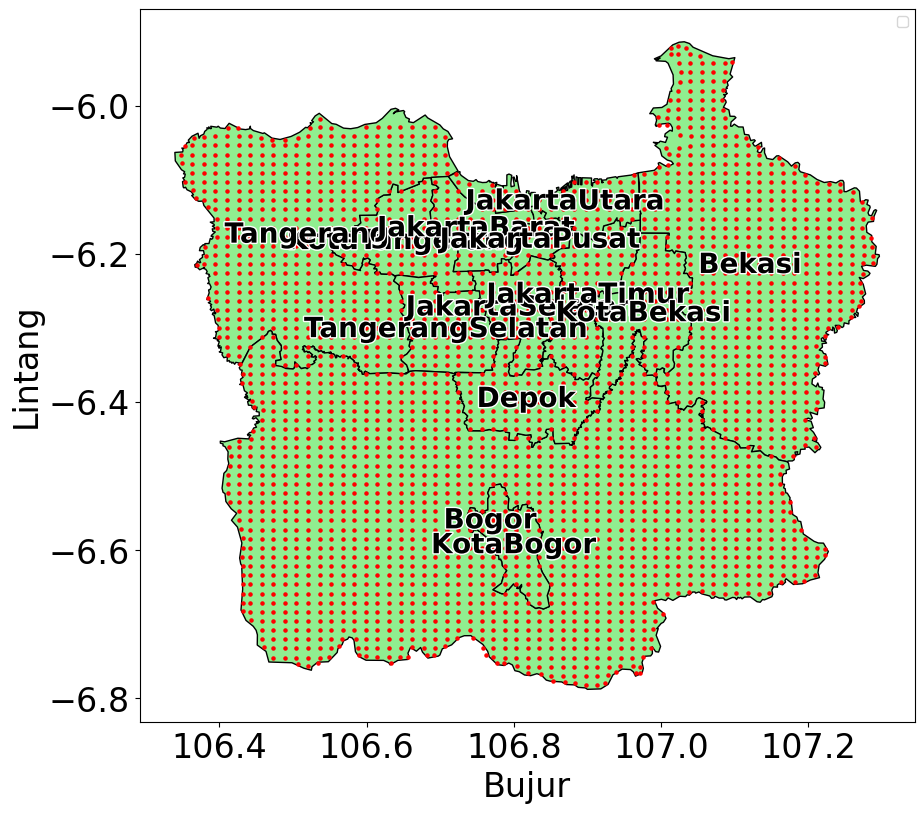

In [ ]:
from shapely.geometry import Point
import matplotlib.patheffects as pe
import geopandas as gpd
# Create geometry column in df
df['geometry'] = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')

indonesia = gpd.read_file('https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_IDN_2.json')

jawa_cities = ['Tangerang', 'KotaBogor','Bogor', 'KotaTangerang', 'JakartaUtara',
       'JakartaBarat', 'JakartaSelatan', 'JakartaPusat',
       'Depok', 'JakartaTimur', 'Bekasi', 'KotaBekasi','TangerangSelatan']
jawa = indonesia[indonesia['NAME_2'].isin(jawa_cities)]
jawa['centroid'] = jawa.geometry.centroid

# Plot peta Jawa
fig, ax = plt.subplots(figsize=(10,10))
jawa.plot(ax=ax, color='lightgreen', edgecolor='black')

cities_unique = gdf.drop_duplicates(subset=['longitude', 'latitude'])

for idx, row in jawa.iterrows():
          ax.annotate(
              text=row['NAME_2'],
              xy=(row['centroid'].x, row['centroid'].y),
              ha='center', va='center',
              fontsize=20, color='black', weight='bold',
              path_effects=[pe.withStroke(linewidth=2, foreground="white")]
          )

cities_unique.plot(ax=ax, color='red', markersize=5)

# Tambahkan judul dan legenda
plt.legend()

plt.xlabel('Bujur', fontsize = 24)
plt.ylabel('Lintang', fontsize = 24)
plt.xticks(fontsize = 24)
plt.yticks(fontsize = 24)
plt.show()

/tmp/ipython-input-639706222.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  jawa['centroid'] = jawa.geometry.centroid
/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipython-input-639706222.py:33: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


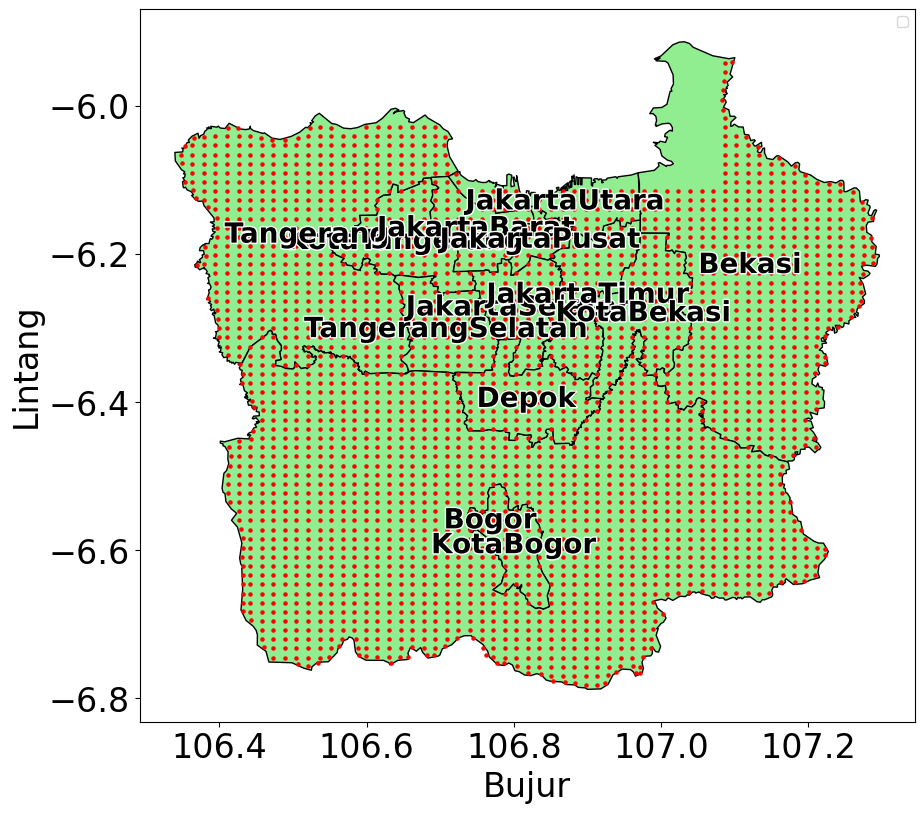

In [ ]:
from shapely.geometry import Point
import matplotlib.patheffects as pe

# Create geometry column in df
wind['geometry'] = [Point(xy) for xy in zip(wind['longitude'], wind['latitude'])]
gdf = gpd.GeoDataFrame(wind, geometry='geometry', crs='EPSG:4326')


jawa_cities = ['Tangerang', 'KotaBogor','Bogor', 'KotaTangerang', 'JakartaUtara',
       'JakartaBarat', 'JakartaSelatan', 'JakartaPusat',
       'Depok', 'JakartaTimur', 'Bekasi', 'KotaBekasi','TangerangSelatan']
jawa = indonesia[indonesia['NAME_2'].isin(jawa_cities)]
jawa['centroid'] = jawa.geometry.centroid

# Plot peta Jawa
fig, ax = plt.subplots(figsize=(10,10))
jawa.plot(ax=ax, color='lightgreen', edgecolor='black')

cities_unique = gdf.drop_duplicates(subset=['longitude', 'latitude'])

for idx, row in jawa.iterrows():
          ax.annotate(
              text=row['NAME_2'],
              xy=(row['centroid'].x, row['centroid'].y),
              ha='center', va='center',
              fontsize=20, color='black', weight='bold',
              path_effects=[pe.withStroke(linewidth=2, foreground="white")]
          )

cities_unique.plot(ax=ax, color='red', markersize=5)

# Tambahkan judul dan legenda
plt.legend()

plt.xlabel('Bujur', fontsize = 24)
plt.ylabel('Lintang', fontsize = 24)
plt.xticks(fontsize = 24)
plt.yticks(fontsize = 24)
plt.show()

In [ ]:
df['date'] = pd.to_datetime(df['date'])
start_date = datetime.datetime(2023, 5, 1)
df = df[(df['date'] >= start_date)]
df=df.rename(columns={"longitude":"x_coord","latitude":"y_coord"})
wind=wind.rename(columns={"longitude":"x_coord","latitude":"y_coord"})

df.sort_values(by=['date','x_coord','y_coord'], inplace=True)

In [ ]:
# no2_df = no2_df[no2_df.CO_mean>=0]
df=df.rename(columns={"mean":"CO_mean"})


wind['date'] = pd.to_datetime(wind['date'])

merged_df = pd.merge(df, wind, on=['x_coord', 'y_coord', 'date'], how='inner')

display(merged_df.head())

,date,CO_mean,x_coord,y_coord,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
0,2023-05-01,0.029764,106.362972,-6.066043,0.071912,-0.107351,0.129251,124.295878
1,2023-05-01,0.029764,106.362972,-6.078393,0.071912,-0.107351,0.129251,124.295878
2,2023-05-01,0.029764,106.362972,-6.053693,0.071912,-0.107351,0.129251,124.295878
3,2023-05-01,0.029764,106.362972,-6.090743,0.071912,-0.107351,0.129251,124.295878
4,2023-05-01,0.029764,106.362972,-6.103093,0.067856,-0.100220,0.121067,124.532079


In [ ]:
merged_df.describe()

,date,CO_mean,x_coord,y_coord,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
count,1326813,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06
mean,2024-03-26 00:28:48.373779456,3.484345e-02,1.068018e+02,-6.396099e+00,-5.791124e-02,-5.763473e-02,7.478363e-01,1.651594e+02
min,2023-05-01 00:00:00,1.393031e-02,1.063478e+02,-6.782034e+00,-3.951742e+00,-3.824649e+00,2.307069e-03,9.735752e-04
25%,2023-09-20 00:00:00,2.968940e-02,1.065988e+02,-6.560591e+00,-4.440066e-01,-3.250706e-01,2.922842e-01,5.398799e+01
50%,2024-03-31 00:00:00,3.378972e-02,1.068033e+02,-6.387143e+00,-1.151644e-01,-4.497592e-02,5.367256e-01,1.593969e+02
75%,2024-09-04 00:00:00,3.892701e-02,1.069920e+02,-6.226593e+00,1.975333e-01,1.961613e-01,9.918722e-01,2.656154e+02
max,2025-04-29 00:00:00,7.176243e-02,1.072882e+02,-5.941738e+00,5.187487e+00,2.094140e+00,6.444995e+00,3.599992e+02
std,NaN,7.148420e-03,2.400327e-01,1.978454e-01,8.753464e-01,4.640432e-01,6.554140e-01,1.164542e+02


In [ ]:
merged_df

,date,CO_mean,x_coord,y_coord,u_component_of_wind_10m,v_component_of_wind_10m,wind_speed_10m,wind_direction_10m
0,2023-05-01,0.029764,106.362972,-6.066043,0.071912,-0.107351,0.129251,124.295878
1,2023-05-01,0.029764,106.362972,-6.078393,0.071912,-0.107351,0.129251,124.295878
2,2023-05-01,0.029764,106.362972,-6.053693,0.071912,-0.107351,0.129251,124.295878
3,2023-05-01,0.029764,106.362972,-6.090743,0.071912,-0.107351,0.129251,124.295878
4,2023-05-01,0.029764,106.362972,-6.103093,0.067856,-0.100220,0.121067,124.532079
...,...,...,...,...,...,...,...,...
1326808,2025-04-29,0.029587,107.284628,-6.178768,-1.248562,-0.054484,1.249751,2.498655
1326809,2025-04-29,0.029587,107.286299,-6.151964,-1.248562,-0.054484,1.249751,2.498655
1326810,2025-04-29,0.029587,107.287021,-6.190315,-1.248562,-0.054484,1.249751,2.498655
1326811,2025-04-29,0.030331,107.287719,-6.202429,-1.248562,-0.054484,1.249751,2.498655


## Rata-rata Kecepatan Angin

In [ ]:
merged_df= merged_df.rename(columns = {"u_component_of_wind_10m":'u10',"v_component_of_wind_10m":'v10'})
merged_df = merged_df[["date","CO_mean","u10","v10","x_coord","y_coord"]]

merged_df['u10']  = merged_df.groupby(['x_coord','y_coord'])['u10'].transform('mean')
merged_df['v10']  = merged_df.groupby(['x_coord','y_coord'])['v10'].transform('mean')

In [ ]:
merged_df

,date,CO_mean,u10,v10,x_coord,y_coord
0,2023-05-01,0.029764,0.129138,-0.205624,106.362972,-6.066043
1,2023-05-01,0.029764,0.129138,-0.205624,106.362972,-6.078393
2,2023-05-01,0.029764,0.129138,-0.205624,106.362972,-6.053693
3,2023-05-01,0.029764,0.129138,-0.205624,106.362972,-6.090743
4,2023-05-01,0.029764,0.122982,-0.205420,106.362972,-6.103093
...,...,...,...,...,...,...
1326808,2025-04-29,0.029587,-0.534941,-0.285329,107.284628,-6.178768
1326809,2025-04-29,0.029587,-0.534941,-0.285329,107.286299,-6.151964
1326810,2025-04-29,0.029587,-0.534941,-0.285329,107.287021,-6.190315
1326811,2025-04-29,0.030331,-0.533784,-0.265644,107.287719,-6.202429


In [ ]:
merged_df.describe()

,date,CO_mean,u10,v10,x_coord,y_coord
count,1326813,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06
mean,2024-03-26 00:28:48.373779456,3.484345e-02,-5.791124e-02,-5.763473e-02,1.068018e+02,-6.396099e+00
min,2023-05-01 00:00:00,1.393031e-02,-7.863542e-01,-4.133699e-01,1.063478e+02,-6.782034e+00
25%,2023-09-20 00:00:00,2.968940e-02,-1.479605e-01,-1.729378e-01,1.065988e+02,-6.560591e+00
50%,2024-03-31 00:00:00,3.378972e-02,-1.554030e-02,-3.664251e-02,1.068033e+02,-6.387143e+00
75%,2024-09-04 00:00:00,3.892701e-02,5.758766e-02,6.404804e-02,1.069920e+02,-6.226593e+00
max,2025-04-29 00:00:00,7.176243e-02,2.544336e-01,1.970594e-01,1.072882e+02,-5.941738e+00
std,NaN,7.148420e-03,1.879002e-01,1.328850e-01,2.400327e-01,1.978454e-01


In [ ]:
merged_df = merged_df[["date","CO_mean","u10","v10","x_coord","y_coord"]]

In [ ]:
merged_df.to_csv("/content/drive/My Drive/TA/Dataset/Localized/Preprocessed_Local_CO.csv")

In [5]:
df = pd.read_csv("/content/drive/My Drive/TA/Dataset/Localized/Preprocessed_Local_CO.csv",index_col=0)

In [6]:
df['date'] = pd.to_datetime(df['date'])

## Teknik Rescaling

In [7]:
#Convert to Numerical Value
df['time'] = (df['date'] - df['date'].min()).dt.days
scale = 1e-2
df.CO_mean = df.CO_mean/scale
df.x_coord = df.x_coord*100
df.y_coord = df.y_coord*100

In [ ]:
df.describe()

,date,CO_mean,u10,v10,x_coord,y_coord,time
count,1326813,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06
mean,2024-03-26 00:28:48.373779456,3.484345e+00,-5.791124e-02,-5.763473e-02,1.068018e+04,-6.396099e+02,3.300200e+02
min,2023-05-01 00:00:00,1.393031e+00,-7.863542e-01,-4.133699e-01,1.063478e+04,-6.782034e+02,0.000000e+00
25%,2023-09-20 00:00:00,2.968940e+00,-1.479605e-01,-1.729378e-01,1.065988e+04,-6.560591e+02,1.420000e+02
50%,2024-03-31 00:00:00,3.378972e+00,-1.554030e-02,-3.664251e-02,1.068033e+04,-6.387143e+02,3.350000e+02
75%,2024-09-04 00:00:00,3.892701e+00,5.758766e-02,6.404804e-02,1.069920e+04,-6.226593e+02,4.920000e+02
max,2025-04-29 00:00:00,7.176243e+00,2.544336e-01,1.970594e-01,1.072882e+04,-5.941738e+02,7.290000e+02
std,NaN,7.148420e-01,1.879002e-01,1.328850e-01,2.400327e+01,1.978454e+01,2.069765e+02


In [ ]:
df

,date,CO_mean,u10,v10,x_coord,y_coord,time
0,2023-05-01,2.976400,0.129138,-0.205624,10636.297192,-606.604262,0
1,2023-05-01,2.976400,0.129138,-0.205624,10636.297192,-607.839262,0
2,2023-05-01,2.976400,0.129138,-0.205624,10636.297192,-605.369262,0
3,2023-05-01,2.976400,0.129138,-0.205624,10636.297192,-609.074262,0
4,2023-05-01,2.976400,0.122982,-0.205420,10636.297192,-610.309262,0
...,...,...,...,...,...,...,...
1326808,2025-04-29,2.958721,-0.534941,-0.285329,10728.462797,-617.876784,729
1326809,2025-04-29,2.958721,-0.534941,-0.285329,10728.629908,-615.196405,729
1326810,2025-04-29,2.958721,-0.534941,-0.285329,10728.702147,-619.031537,729
1326811,2025-04-29,3.033131,-0.533784,-0.265644,10728.771896,-620.242884,729


## Lowpass Filtering dan Cek Normalitas Residu

In [ ]:
def low_pass_filter(series, cutoff=0.1):
    """Applies a low-pass filter to a pandas Series."""
    signal = series.values
    fft_vals = np.fft.fft(signal)
    freqs = np.fft.fftfreq(len(signal), d=1) # d=1 assumes unit time spacing

    # Apply the ideal low-pass filter
    mask = np.abs(freqs) < cutoff
    filtered_fft = fft_vals * mask

    # Return the real part of the inverse FFT
    return np.fft.ifft(filtered_fft).real

full_dates = pd.date_range(start=df['date'].min(),end=df['date'].max(),freq='D')
coords = df[['x_coord', 'y_coord']].drop_duplicates()
full_index = pd.MultiIndex.from_frame(
    coords.merge(pd.DataFrame({'date': full_dates}), how='cross')
)

df2 = (
    df.set_index(['x_coord', 'y_coord', 'date'])
    .reindex(full_index)
    .reset_index()
    .rename(columns={'level_0': 'x_coord', 'level_1': 'y_coord', 'level_2': 'date'})
)

df2['CO_mean'] = (df2.groupby(['x_coord', 'y_coord'])['CO_mean'].transform(lambda s: s.interpolate(method='linear', limit_direction='both')))
df['CO_filtered'] = df.groupby(['x_coord', 'y_coord'])['CO_mean'].transform(low_pass_filter)
df = df[['date', 'CO_mean','u10','v10','x_coord', 'y_coord','time']].merge(
    df[['date', 'x_coord', 'y_coord', 'CO_filtered']],
    on=['date', 'x_coord', 'y_coord'],
    how='left'
)

# 'df' now contains the new 'CO_filtered' column with the results.
print(df.head())

        date  CO_mean       u10       v10       x_coord     y_coord  time  \
0 2023-05-01   2.9764  0.129138 -0.205624  10636.297192 -606.604262     0   
1 2023-05-01   2.9764  0.129138 -0.205624  10636.297192 -607.839262     0   
2 2023-05-01   2.9764  0.129138 -0.205624  10636.297192 -605.369262     0   
3 2023-05-01   2.9764  0.129138 -0.205624  10636.297192 -609.074262     0   
4 2023-05-01   2.9764  0.122982 -0.205420  10636.297192 -610.309262     0   

   CO_filtered  
0     3.370741  
1     3.370741  
2     3.370741  
3     3.370741  
4     3.397441  


In [ ]:
df.describe()

,date,CO_mean,u10,v10,x_coord,y_coord,time,CO_filtered
count,1326813,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06
mean,2024-03-26 00:28:48.373779456,3.484345e+00,-5.791124e-02,-5.763473e-02,1.068018e+04,-6.396099e+02,3.300200e+02,3.484345e+00
min,2023-05-01 00:00:00,1.393031e+00,-7.863542e-01,-4.133699e-01,1.063478e+04,-6.782034e+02,0.000000e+00,2.011518e+00
25%,2023-09-20 00:00:00,2.968940e+00,-1.479605e-01,-1.729378e-01,1.065988e+04,-6.560591e+02,1.420000e+02,3.022499e+00
50%,2024-03-31 00:00:00,3.378972e+00,-1.554030e-02,-3.664251e-02,1.068033e+04,-6.387143e+02,3.350000e+02,3.386949e+00
75%,2024-09-04 00:00:00,3.892701e+00,5.758766e-02,6.404804e-02,1.069920e+04,-6.226593e+02,4.920000e+02,3.854765e+00
max,2025-04-29 00:00:00,7.176243e+00,2.544336e-01,1.970594e-01,1.072882e+04,-5.941738e+02,7.290000e+02,6.517823e+00
std,NaN,7.148420e-01,1.879002e-01,1.328850e-01,2.400327e+01,1.978454e+01,2.069765e+02,6.328990e-01


In [9]:
from scipy.stats import kstest
import pandas as pd


def check_normality(group):
    """
    Calculates KS test for normality on the residuals of a given group.
    """
    residuals = group['CO_mean'] - group['CO_filtered']
    std_residuals = residuals.std()

    # Handle cases where all residuals are the same
    if std_residuals == 0:
        return pd.Series({
            'Test Statistic (KS)': None,
            'P-value (KS)': None,
            'Normality (KS)': "Standard deviation is zero",
            'Data Points': len(residuals)
        })

    # Perform the KS test
    mean_residuals = residuals.mean()
    stat, p = kstest(residuals, 'norm', args=(mean_residuals, std_residuals))

    # Determine normality based on the p-value
    normality = "Gaussian" if p > 0.01 else "Not Gaussian"

    return pd.Series({
        'Test Statistic (KS)': stat,
        'P-value (KS)': p,
        'Normality (KS)': normality,
        'Data Points': len(residuals)
    })

# Group by coordinates only and apply the function
normality_results_df = df.groupby(['x_coord', 'y_coord']).apply(check_normality).reset_index()

# Display the first few rows of the results
print(normality_results_df.head())

        x_coord     y_coord  Test Statistic (KS)  P-value (KS) Normality (KS)  \
0  10634.777381 -606.702390             0.032164      0.755144       Gaussian   
1  10634.867379 -607.772079             0.032164      0.755144       Gaussian   
2  10635.274668 -610.351014             0.032164      0.755144       Gaussian   
3  10635.280286 -605.463514             0.032164      0.755144       Gaussian   
4  10636.297192 -606.604262             0.039037      0.455400       Gaussian   

   Data Points  
0          428  
1          428  
2          428  
3          428  
4          473  


/tmp/ipython-input-1252786904.py:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normality_results_df = df.groupby(['x_coord', 'y_coord']).apply(check_normality).reset_index()


In [ ]:
normality_results_df["Normality (KS)"].value_counts()

,count
Normality (KS),
Gaussian,2861


In [ ]:
df.describe()

,date,CO_mean,u10,v10,x_coord,y_coord,time,CO_filtered
count,1326813,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06
mean,2024-03-26 00:28:48.373779456,3.484345e+00,-5.791124e-02,-5.763473e-02,1.068018e+04,-6.396099e+02,3.300200e+02,3.484345e+00
min,2023-05-01 00:00:00,1.393031e+00,-7.863542e-01,-4.133699e-01,1.063478e+04,-6.782034e+02,0.000000e+00,2.011518e+00
25%,2023-09-20 00:00:00,2.968940e+00,-1.479605e-01,-1.729378e-01,1.065988e+04,-6.560591e+02,1.420000e+02,3.022499e+00
50%,2024-03-31 00:00:00,3.378972e+00,-1.554030e-02,-3.664251e-02,1.068033e+04,-6.387143e+02,3.350000e+02,3.386949e+00
75%,2024-09-04 00:00:00,3.892701e+00,5.758766e-02,6.404804e-02,1.069920e+04,-6.226593e+02,4.920000e+02,3.854765e+00
max,2025-04-29 00:00:00,7.176243e+00,2.544336e-01,1.970594e-01,1.072882e+04,-5.941738e+02,7.290000e+02,6.517823e+00
std,NaN,7.148420e-01,1.879002e-01,1.328850e-01,2.400327e+01,1.978454e+01,2.069765e+02,6.328990e-01


In [10]:
averaged_df = df.groupby(['x_coord', 'y_coord'])[['u10', 'v10']].mean().reset_index()
df_for_update = df.drop(columns=['u10', 'v10'])
filtered_df = pd.merge(df_for_update, averaged_df, on=['x_coord', 'y_coord'], how='left')
filtered_df

,date,CO_mean,x_coord,y_coord,time,CO_filtered,u10,v10
0,2023-05-01,2.976400,10636.297192,-606.604262,0,3.370741,0.129138,-0.205624
1,2023-05-01,2.976400,10636.297192,-607.839262,0,3.370741,0.129138,-0.205624
2,2023-05-01,2.976400,10636.297192,-605.369262,0,3.370741,0.129138,-0.205624
3,2023-05-01,2.976400,10636.297192,-609.074262,0,3.370741,0.129138,-0.205624
4,2023-05-01,2.976400,10636.297192,-610.309262,0,3.397441,0.122982,-0.205420
...,...,...,...,...,...,...,...,...
1326808,2025-04-29,2.958721,10728.462797,-617.876784,729,2.992541,-0.534941,-0.285329
1326809,2025-04-29,2.958721,10728.629908,-615.196405,729,2.992541,-0.534941,-0.285329
1326810,2025-04-29,2.958721,10728.702147,-619.031537,729,2.992541,-0.534941,-0.285329
1326811,2025-04-29,3.033131,10728.771896,-620.242884,729,3.216166,-0.533784,-0.265644


In [ ]:
filtered_df.describe()

,date,CO_mean,x_coord,y_coord,time,CO_filtered,u10,v10
count,1326813,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06,1.326813e+06
mean,2024-03-26 00:28:48.373779456,3.484345e+00,1.068018e+04,-6.396099e+02,3.300200e+02,3.484345e+00,-5.791124e-02,-5.763473e-02
min,2023-05-01 00:00:00,1.393031e+00,1.063478e+04,-6.782034e+02,0.000000e+00,2.011518e+00,-7.863542e-01,-4.133699e-01
25%,2023-09-20 00:00:00,2.968940e+00,1.065988e+04,-6.560591e+02,1.420000e+02,3.022499e+00,-1.479605e-01,-1.729378e-01
50%,2024-03-31 00:00:00,3.378972e+00,1.068033e+04,-6.387143e+02,3.350000e+02,3.386949e+00,-1.554030e-02,-3.664251e-02
75%,2024-09-04 00:00:00,3.892701e+00,1.069920e+04,-6.226593e+02,4.920000e+02,3.854765e+00,5.758766e-02,6.404804e-02
max,2025-04-29 00:00:00,7.176243e+00,1.072882e+04,-5.941738e+02,7.290000e+02,6.517823e+00,2.544336e-01,1.970594e-01
std,NaN,7.148420e-01,2.400327e+01,1.978454e+01,2.069765e+02,6.328990e-01,1.879002e-01,1.328850e-01


# Split Train Testing

In [11]:
np.random.seed(42)


shuffled_df = filtered_df.sample(frac=1).reset_index(drop=True)

split_ratio = 0.7

# Calculate the number of training samples
train_size = int(split_ratio * len(shuffled_df))

# Split the data
train_df = shuffled_df[:train_size]
test_df = shuffled_df[train_size:]

# Convert to tensors
X_train = tf.convert_to_tensor(train_df[['time','x_coord', 'y_coord']].values, dtype= tf.float32)
u_train =  tf.convert_to_tensor(train_df['CO_filtered'].values.reshape(-1, 1), dtype= tf.float32)

X_test =  tf.convert_to_tensor(test_df[['time','x_coord', 'y_coord']].values, dtype= tf.float32)
u_test =  tf.convert_to_tensor(test_df['CO_filtered'].values.reshape(-1, 1), dtype= tf.float32)

W_u =tf.convert_to_tensor(train_df[[ 'u10']].values, dtype= tf.float32)
W_v =tf.convert_to_tensor(train_df[['v10']].values, dtype= tf.float32)

In [ ]:
X_train

<tf.Tensor: shape=(928769, 3), dtype=float32, numpy=
array([[   88.     , 10688.189  ,  -612.77924],
       [  566.     , 10716.495  ,  -610.30927],
       [  439.     , 10714.605  ,  -665.8574 ],
       ...,
       [  112.     , 10716.053  ,  -607.03186],
       [   99.     , 10667.747  ,  -647.35925],
       [  729.     , 10722.785  ,  -617.71924]], dtype=float32)>

In [ ]:
X_test

<tf.Tensor: shape=(398044, 3), dtype=float32, numpy=
array([[  448.     , 10713.35   ,  -628.8343 ],
       [  249.     , 10658.3125 ,  -646.12427],
       [  288.     , 10642.818  ,  -634.85065],
       ...,
       [   61.     , 10644.16   ,  -618.9543 ],
       [  339.     , 10652.022  ,  -628.8343 ],
       [   57.     , 10680.327  ,  -638.71423]], dtype=float32)>

In [ ]:
u_train

<tf.Tensor: shape=(928769, 1), dtype=float32, numpy=
array([[4.016969 ],
       [3.2147849],
       [2.953204 ],
       ...,
       [3.4061174],
       [3.875674 ],
       [3.024418 ]], dtype=float32)>

In [ ]:
u_test

<tf.Tensor: shape=(398044, 1), dtype=float32, numpy=
array([[3.3329265],
       [3.261877 ],
       [3.2003546],
       ...,
       [3.4469466],
       [3.1565864],
       [3.674022 ]], dtype=float32)>

In [ ]:
W_u

<tf.Tensor: shape=(928769, 1), dtype=float32, numpy=
array([[-0.38666815],
       [-0.58250654],
       [ 0.01500524],
       ...,
       [-0.5667542 ],
       [ 0.05758766],
       [-0.39999828]], dtype=float32)>

In [ ]:
W_v

<tf.Tensor: shape=(928769, 1), dtype=float32, numpy=
array([[-0.30968702],
       [-0.27747717],
       [-0.06178088],
       ...,
       [-0.28159213],
       [ 0.07013614],
       [-0.1878103 ]], dtype=float32)>

# Persiapan PINN

## Persiapan Arsitektur PINN

In [12]:
lb = filtered_df[['time','x_coord', 'y_coord']].min().values
ub = filtered_df[['time','x_coord', 'y_coord']].max().values

In [ ]:
arch = {'output_dim':1, 'num_hidden_layers':5, 'num_neurons_per_layer':100,'activation':'swish', 'trainable_B':True, 'sigmas':[1,2], 'mapping_size':64}
n_models = 20

models = [None] * n_models

for i in range(n_models):
  tf.random.set_seed(i)
  models[i] = Hybrid_IdentificationNet(initial_lambda=0.0, lb=lb, ub=ub, **arch)
  models[i].build((None, 3))

## Persiapan Automatic Differentiation dan Fungsi Loss

### Inverse Method

In [ ]:
def get_r_inv(t, x, y, model, lambd, fun_r,u_data=u_train):
    """
    Computes the residuals of the PDE using automatic differentiation.
    """
    t = tf.cast(t, tf.float32)
    x = tf.cast(x, tf.float32)
    y = tf.cast(y, tf.float32)

    with tf.GradientTape(persistent=True) as tape:
        tape.watch(x)
        tape.watch(y)
        with tf.GradientTape(persistent=True) as tape2:
            tape2.watch(t)
            tape2.watch(x)
            tape2.watch(y)

            # Combine inputs for model prediction (adjust order if needed)
            inputs = tf.concat([t, x, y], axis=1)  # or [x, y, t] if your model expects that
            u_pred = model(inputs)  # model prediction, shape (batch_size, 1)

        u_t = tape2.gradient(u_pred, t)
        u_x = tape2.gradient(u_pred, x)
        u_y = tape2.gradient(u_pred, y)

    u_xx = tape.gradient(u_x, x)
    u_yy = tape.gradient(u_y, y)
    del tape
    del tape2

    return fun_r(t, x, y, u_pred, u_t, u_x,u_y, u_xx, u_yy, model)

def fun_r_inv(t, x, y, u_pred, u_t,u_x,u_y, u_xx, u_yy, model, u_data= u_train):
    # # --- Calculate the Gaussian source term ---
    # term_x = tf.square(x - model.source_x0) / (2 * tf.square(model.source_sigma_x))
    # term_y = tf.square(y - model.source_y0) / (2 * tf.square(model.source_sigma_y))
    # gaussian_source = model.source_A * tf.exp(-(term_x + term_y))
    # # ---
    # This function is used in the forward pass loss calculation, where W_u and W_v are global
    # This might still cause issues if not careful about batching in the forward pass.
    pde_residual = scale*(u_t + W_u * u_x + W_v * u_y- model.lambd * (u_xx + u_yy))
    return tf.reduce_mean(tf.square(pde_residual))

def get_r_param(t, x, y, Wu, Wv, model):
    t = tf.cast(t, tf.float32)
    x = tf.cast(x, tf.float32)
    y = tf.cast(y, tf.float32)
    Wu = tf.cast(Wu, tf.float32)
    Wv = tf.cast(Wv, tf.float32)


    with tf.GradientTape(persistent=True) as tape:
        tape.watch(x)
        tape.watch(y)
        with tf.GradientTape(persistent=True) as tape2:
            tape2.watch(t)
            tape2.watch(x)
            tape2.watch(y)

            # Combine inputs for model prediction (adjust order if needed)
            inputs = tf.concat([t, x, y], axis=1)  # or [x, y, t] if your model expects that
            u_pred = model(inputs)  # model prediction, shape (batch_size, 1)

        u_t = tape2.gradient(u_pred, t)
        u_x = tape2.gradient(u_pred, x)
        u_y = tape2.gradient(u_pred, y)

    u_xx = tape.gradient(u_x, x)
    u_yy = tape.gradient(u_y, y)

    del tape
    del tape2

    # # ---
    # term_x = tf.square(x - model.source_x0) / (2 * tf.square(model.source_sigma_x))
    # term_y = tf.square(y - model.source_y0) / (2 * tf.square(model.source_sigma_y))
    # gaussian_source = model.source_A * tf.exp(-(term_x + term_y))
    # # ---
    with tf.GradientTape(persistent=True) as tape_lambd:
      tape_lambd.watch(model.lambd)
      pde_residual = scale*(u_t) +scale* Wu * u_x + scale*Wv * u_y- model.lambd * (scale*u_xx + scale*u_yy)

      loss = tf.reduce_mean(tf.square(pde_residual))

    g = tape_lambd.gradient(loss, model.lambd)

    del tape_lambd

    return loss, g

### Forward Method

In [ ]:
def get_r_fwd(t, x, y, model, lambd, fun_r,u_data=u_train, Wu=W_u, Wv=W_v): # Added Wu and Wv here
    """
    Computes the residuals of the PDE using automatic differentiation.
    """
    t = tf.convert_to_tensor(t, dtype=tf.float32)
    x = tf.convert_to_tensor(x, dtype=tf.float32)
    y = tf.convert_to_tensor(y, dtype=tf.float32)
    # Ensure Wu and Wv are tensors if not None
    if Wu is not None:
        Wu = tf.convert_to_tensor(Wu, dtype=tf.float32)
    if Wv is not None:
        Wv = tf.convert_to_tensor(Wv, dtype=tf.float32)


    with tf.GradientTape(persistent=True) as tape:
        tape.watch(x)
        tape.watch(y)
        with tf.GradientTape(persistent=True) as tape2:
            tape2.watch(t)
            tape2.watch(x)
            tape2.watch(y)
            u = model(tf.concat([t, x,y], axis=1))  # Ensure proper tensor shape
        u_t = tape2.gradient(u, t)
        u_x = tape2.gradient(u, x)
        u_y = tape2.gradient(u, y)

    u_xx = tape.gradient(u_x, x)
    u_yy = tape.gradient(u_y, y)
    del tape
    del tape2
    return fun_r_fwd(t, x, y, u, u_t,u_x,u_y,u_xx, u_yy, model,lambd,u_data, Wu=Wu, Wv=Wv) # Pass Wu and Wv here

def fun_r_fwd(t, x, y, u, u_t,u_x,u_y, u_xx, u_yy, model,lambd, u_data= u_train, weight_pde=1, weight_data=10, Wu=W_u, Wv=W_v): # Added Wu and Wv here
    if Wu is None or Wv is None:
        print("Warning: Wu or Wv is None in fun_r_fwd")

    pde_residual = scale*(u_t) +scale* Wu * u_x + scale*Wv * u_y- lambd * (scale*u_xx + scale*u_yy)
    pde_loss = tf.reduce_mean(tf.square(pde_residual))

    u_pred_data = u
    data_loss = tf.reduce_mean(tf.square((u_pred_data - u_data)))

    total_loss = weight_pde * pde_loss + weight_data*data_loss
    tf.print("PDE Loss:", pde_loss, "Data Loss:",data_loss, "Total Loss:", total_loss)
    return total_loss

# Pelatihan Invers

In [ ]:
lr_comb_param = {'boundaries': [7000,10000,11000,13000,15000,20000],
                 'initial_learning_rate': 1e-2,
                 'decay_steps': 1000,
                 'decay_rate': 0.9,
                 'values_steps': 2}
lr_comb = CombinedDecays(**lr_comb_param)
lr_comb.get_config()

{'initial_learning_rate': 0.01,
 'decay_steps': 1000,
 'decay_rate': 0.9,
 'staircase': False,
 'boundaries': [7000, 10000, 11000, 13000, 15000, 20000],
 'values': [0.004782969000000001,
  0.0023914845000000003,
  0.0011957422500000002,
  0.0005978711250000001,
  0.00029893556250000004,
  0.00014946778125000002,
  7.473389062500001e-05],
 'values_steps': [2, 2, 2, 2, 2, 2],
 'name': None}

In [ ]:
timeout = 300
initial_lambdas = [0.5]
batch_size = 4096 # Define a suitable batch size

old_timeout = timeout
models_Adam = [None] * n_models
hists_Adam = [None] * n_models

for i in range(n_models):
  timeout = old_timeout
  models_Adam[i] = []
  hists_Adam[i] = []

  for j in range(len(initial_lambdas)):
    print('{:s}\nIteration: {:d} Initial lambda: {}\n{:s}'.format(50*'-',i+1,initial_lambdas[j],50*'-'))
    # Prepare models' architecture
    tf.random.set_seed(i + j)
    models_Adam[i].append(Hybrid_IdentificationNet(initial_lambda=initial_lambdas[j], lb=lb, ub=ub, **arch))

    models_Adam[i][j].build((None, 3))

    # Copy weights from the previous model instance to make every iteration comparable
    models_Adam[i][j].set_weights(models[i].get_weights())

    # Assigning initial lambda
    # models_Adam[i][j].trainable_variables[-1].assign(initial_lambdas[j])
    models_Adam[i][j].initial_lambda = initial_lambdas[j]

    # Prepare optimizer
    optim_Adam = tf.keras.optimizers.AdamW(learning_rate=lr_comb, weight_decay = 0.0001)
    optim_inv_Adam = tf.keras.optimizers.AdamW(learning_rate=lr_comb, weight_decay = 0.0001)

    # Initialize solver
    solver_Adam = Hybrid_IdentificationSolver(models_Adam[i][j], X_train,fun_r_inv, get_r_inv)

    # Train models
    print('\n\nAdam\n')
    solver_Adam.solve_with_TFoptimizer(optim_Adam, optim_inv_Adam, get_r_param, X_train, u_train, W_u, W_v, timeout_param=timeout*0.2, timeout_fwd=timeout*0.8, batch_size=batch_size)

    # Store evolution of lambdas and hists
    hists_Adam[i].append([models_Adam[i][j].lambd_list, solver_Adam.hist])

    print('\n\n\n')

--------------------------------------------------
Iteration: 1 Initial lambda: 0.5
--------------------------------------------------


Adam



/usr/local/lib/python3.12/dist-packages/keras/src/optimizers/base_optimizer.py:855: UserWarning: Gradients do not exist for variables ['Variable:0'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(


--- End of Epoch 1, Iteration 1, Average Epoch Loss: 1.127021e+00 ---
--- End of Epoch 2, Iteration 2, Average Epoch Loss: 6.385600e-02 ---
--- End of Epoch 3, Iteration 3, Average Epoch Loss: 5.721231e-02 ---
--- End of Epoch 4, Iteration 4, Average Epoch Loss: 5.437986e-02 ---
--- End of Epoch 5, Iteration 5, Average Epoch Loss: 5.260583e-02 ---
--- End of Epoch 6, Iteration 6, Average Epoch Loss: 5.047124e-02 ---
--- End of Epoch 7, Iteration 7, Average Epoch Loss: 4.735467e-02 ---
--- End of Epoch 8, Iteration 8, Average Epoch Loss: 4.512224e-02 ---
--- End of Epoch 9, Iteration 9, Average Epoch Loss: 4.090675e-02 ---
Timeout reached. Stopping training.


Finding PDE parameters.
It 00009: loss = 1.04545869e-07 lambda = 0.4923328
It 00010: loss = 1.04538827e-07 lambda = 0.4795604
It 00011: loss = 1.04519707e-07 lambda = 0.46458414
It 00012: loss = 1.04513283e-07 lambda = 0.4484345
It 00013: loss = 1.04487015e-07 lambda = 0.43168402
It 00014: loss = 1.04478062e-07 lambda = 0.4147996


In [ ]:
path = dir + "COModel/Fourier/Softplus_Local_Fourier_swish_inv/"


In [ ]:
for i in range(n_models):
  for j in range(len(initial_lambdas)):
    models_Adam[i][j].save_weights(path+"_"+str(i)+"_model_Adam_"+str(j)+".weights.h5", 'h5')
for i in range(n_models):
  for j in range(len(initial_lambdas)):
    np.savetxt(path + "loss/hist_Adam_" + str(i) + "_" + str(j) + ".csv", hists_Adam[i][j][1], delimiter=",")

for i in range(n_models):
  for j in range(len(initial_lambdas)):
    np.savetxt(path + "loss/lambd_Adam_" + str(i) + "_" + str(j) + ".csv", hists_Adam[i][j][0], delimiter=",")

In [ ]:
n_models=60
hists_Adam1 = [None] * n_models
lambd_Adam1 = [None] * n_models
initial_lambdas = [0.5]

for i in range(60):
    hists_Adam1[i] = []
    lambd_Adam1[i]=[]
    for j in range(len(initial_lambdas)):
        hists_Adam1[i].append(pd.read_csv(path + "/loss/hist_Adam_" + str(i) + "_" + str(j) + ".csv",header=None).transpose())
        lambd_Adam1[i].append(pd.read_csv(path + "/loss/lambd_Adam_" + str(i) + "_" + str(j) + ".csv",header=None).transpose())

## Grafik Loss

<>:25: SyntaxWarning: invalid escape sequence '\h'
<>:25: SyntaxWarning: invalid escape sequence '\h'
<>:25: SyntaxWarning: invalid escape sequence '\h'
<>:25: SyntaxWarning: invalid escape sequence '\h'
<>:25: SyntaxWarning: invalid escape sequence '\h'
<>:25: SyntaxWarning: invalid escape sequence '\h'
/tmp/ipython-input-948564282.py:25: SyntaxWarning: invalid escape sequence '\h'
  cols = ['$\hat{\lambda}_{1_0}^{(1)} = -1$', '$\hat{\lambda}_{1_0}^{(1)} = -2$', '$\hat{\lambda}_{1_0}^{(1)} = -5$']
/tmp/ipython-input-948564282.py:25: SyntaxWarning: invalid escape sequence '\h'
  cols = ['$\hat{\lambda}_{1_0}^{(1)} = -1$', '$\hat{\lambda}_{1_0}^{(1)} = -2$', '$\hat{\lambda}_{1_0}^{(1)} = -5$']
/tmp/ipython-input-948564282.py:25: SyntaxWarning: invalid escape sequence '\h'
  cols = ['$\hat{\lambda}_{1_0}^{(1)} = -1$', '$\hat{\lambda}_{1_0}^{(1)} = -2$', '$\hat{\lambda}_{1_0}^{(1)} = -5$']


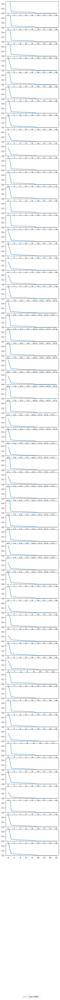

In [ ]:
fig, axes = plt.subplots(nrows=n_models, ncols=len(initial_lambdas), figsize=(5,80))

# fig, axes = plt.subplots(nrows=n_models, ncols=len(initial_lambdas), figsize=(15,5))

for i in range(n_models):
  axes[i].plot(np.linspace(0, len(hists_Adam1[i][0].transpose()),len(hists_Adam1[i][0].transpose())), hists_Adam1[i][0].transpose())
  axes[i].set_ylim([0,5e-1])

  # axes[0].plot(np.linspace(0, len(hists_Adam1[i][0].transpose()),len(hists_Adam1[i][0].transpose())), hists_Adam1[i][0].transpose())
  # axes[0].set_ylim([0,5])

  # axes[1].plot(np.linspace(0, len(hists_Adam1[i][1].transpose()), len(hists_Adam1[i][1].transpose())), hists_Adam1[i][1].transpose())
  # axes[1].set_ylim([0,5])

  # axes[2].plot(np.linspace(0, len(hists_Adam1[i][2].transpose()), len(hists_Adam1[i][2].transpose())), hists_Adam1[i][2].transpose())
  # axes[2].set_ylim([0,5])


  # print(f"len Atempt-{i} and init lambda {initial_lambdas[0]}: ",len(hists_Adam1[i][0].transpose()))
  # print(f"len Atempt-{i} and init lambda {initial_lambdas[1]}: ",len(hists_Adam1[i][1].transpose()))
  # print(f"len Atempt-{i} and init lambda {initial_lambdas[2]}: ",len(hists_Adam1[i][2].transpose()))
  # print(f"len Atempt-{i} and init lambda {initial_lambdas[3]}: ",len(hists_Adam1[i][3].transpose()))

# timeout = 250
cols = ['$\hat{\lambda}_{1_0}^{(1)} = -1$', '$\hat{\lambda}_{1_0}^{(1)} = -2$', '$\hat{\lambda}_{1_0}^{(1)} = -5$']
rows = ['Attempt {}'.format(row) for row in range(1, n_models+1)]

# pad = 5 # in points


# for ax, col in zip(axes[0], cols):
#   ax.annotate(col, xy=(0.5, 1.05), xytext=(0, pad),
#               xycoords='axes fraction', textcoords='offset points',
#               size='large', ha='center', va='baseline')

# for ax, row in zip(axes[:,0], rows):
#   ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
#               xycoords=ax.yaxis.label, textcoords='offset points',
#               size='large', ha='right', va='center')

# fig.tight_layout()

fig.legend(['Loss Adam '], loc='lower center', bbox_to_anchor=(0.5, -0.02), ncol=3, frameon=True)

plt.show()

## Predict and Evaluate Inverse Problem

In [ ]:
def lambdas(hists, iter_model, iter_init):
  return lambd_Adam1[i][0].transpose().iloc[-1,:].values[0]

df = pd.DataFrame(columns=['Adam'])
df = df.round(10)

for i in range(n_models):
  x = []
  for j in range(len(initial_lambdas)):
    x.append(lambdas(hists_Adam1, i, j))

  df.loc['Attempt '+str(i+1)] = x

print("Lambda Prediction Given U(x,t)")
df

Lambda Prediction Given U(x,t)


,Adam
Attempt 1,0.398164
Attempt 2,0.396071
Attempt 3,0.411121
Attempt 4,0.267964
Attempt 5,0.402437
Attempt 6,0.375635
Attempt 7,0.281886
Attempt 8,0.344097
Attempt 9,0.385069
Attempt 10,0.249755


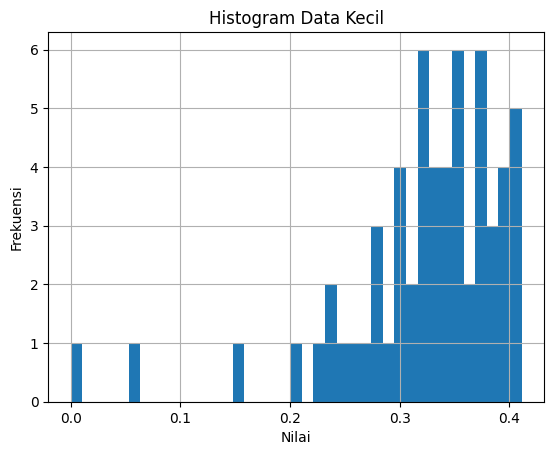

In [ ]:
bins = np.linspace(0, max(df.Adam), 40)  # 20 bins antara 0 dan 0.0001
ax = df.iloc[:, 0].plot(kind='hist', bins=bins, align='mid')

plt.xlabel("Nilai")
plt.ylabel("Frekuensi")
plt.title("Histogram Data Kecil")
plt.grid(True)
plt.show()

/usr/local/lib/python3.12/dist-packages/scipy/stats/_continuous_distns.py:796: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
/usr/local/lib/python3.12/dist-packages/scipy/stats/_continuous_distns.py:801: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
/usr/local/lib/python3.12/dist-packages/scipy/stats/_continuous_distns.py:1205: RuntimeWarning: overflow encountered in power
  - sc.xlog1py(d_+1, x_**(-c_))))


beta         KS=0.0725, p=0.8879, params=(np.float64(46.336002332373056), np.float64(1.2789128721802676), np.float64(-2.9546616260541176), np.float64(3.367022923671354))
gengamma     KS=0.0923, p=0.6524, params=(np.float64(0.04134059754867822), np.float64(268.7061127024439), np.float64(-0.6487143408706306), np.float64(1.0601486545670027))
burr         KS=0.1028, p=0.5168, params=(np.float64(1377.9931723280124), np.float64(0.007544258894028098), np.float64(-0.6124257755183828), np.float64(1.0244410010153735))
fisk         KS=0.1122, p=0.4071, params=(np.float64(487262278.20243055), np.float64(-18544999.848177604), np.float64(18545000.180624954))
norm         KS=0.1426, p=0.158, params=(np.float64(0.3219199814122476), np.float64(0.07768266177198552))
lognorm      KS=0.1426, p=0.158, params=(np.float64(9.482462461183538e-06), -8191.9999339578535, np.float64(8192.321853570946))
gamma        KS=0.1616, p=0.07776, params=(np.float64(318.89592002594486), np.float64(-1.1503897527113578), np.fl

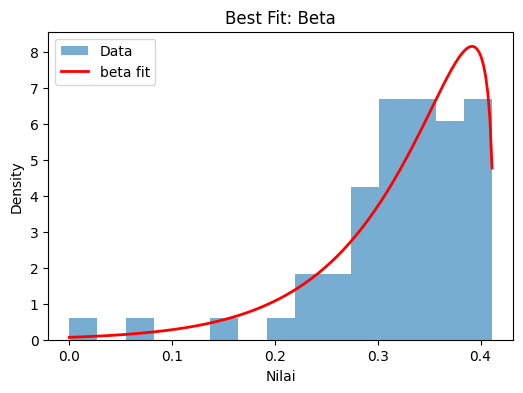

Mean Beta: 0.3219247413509856


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# If df is a DataFrame, pick the column you want to fit:
data = df.iloc[:, 0].to_numpy()  # 1D array

distributions = [
    stats.norm,          # Normal
    stats.expon,         # Exponential
    stats.gamma,         # Gamma
    stats.beta,          # Beta
    stats.lognorm,       # Lognormal
    stats.uniform,       # Uniform
    stats.invgauss,      # Inverse Gaussian
    stats.burr,          # Burr
    stats.fisk,          # Fisk (log-logistic)
    stats.gengamma       # Generalized Gamma
]

results = {}

# Fit tiap distribusi dan uji KS
for dist in distributions:
    try:
        params = dist.fit(data)
        ks_stat, ks_pval = stats.kstest(data, dist.cdf, args=params)
        results[dist.name] = {
            "KS_stat": float(ks_stat),
            "p_value": float(ks_pval),
            "params": params
        }
    except Exception as e:
        results[dist.name] = {"KS_stat": np.inf, "p_value": 0, "params": None}
        print(f"Gagal fit {dist.name}: {e}")

# Urutkan dari KS terkecil
sorted_results = sorted(results.items(), key=lambda x: x[1]["KS_stat"])

# Tampilkan hasil
for name, res in sorted_results:
    if res["params"] is not None:
        print(f"{name:12s} KS={res['KS_stat']:.4f}, p={res['p_value']:.4g}, params={res['params']}")

# Plot best fit
best_name, best_info = sorted_results[0]
best_dist = getattr(stats, best_name)
params = best_info["params"]

x = np.linspace(min(data), max(data), 200)
pdf = best_dist.pdf(x, *params)

plt.figure(figsize=(6,4))
plt.hist(data, bins=15, density=True, alpha=0.6, label="Data")
plt.plot(x, pdf, 'r-', lw=2, label=f"{best_name} fit")
plt.title(f"Best Fit: {best_name.capitalize()}")
plt.xlabel("Nilai")
plt.ylabel("Density")
plt.legend()
plt.show()

params = stats.beta.fit(data)
c, d, loc, scale = params
mean_beta = stats.beta.mean(c, d, loc=loc, scale=scale)
print("Mean Beta:", mean_beta)

In [ ]:
print(df.mean(axis=0).round(10))
df.loc['Average'] = df.mean(axis=0)
df.loc['StdDev'] = df.std(axis=0, ddof=1)
df.loc['CV'] = df.loc['StdDev'] / df.loc['Average']
df.loc[['Average', 'StdDev', 'CV']] = df.loc[['Average', 'StdDev', 'CV']].round(10)
print(df.tail(3))

Adam    0.32192
dtype: float64
             Adam
Average  0.321920
StdDev   0.077683
CV       0.241310


# Pelatihan Kasus Forward

In [ ]:
n_models = 2

arch = {'output_dim':1, 'num_hidden_layers':5, 'num_neurons_per_layer':100,'activation':'swish', 'trainable_B':True, 'sigmas':[1.0,2.0], 'mapping_size':64}

models = [None] * n_models

for i in range(n_models):
  tf.random.set_seed(i)
  models[i] = PINN_NeuralNet(lb=lb, ub=ub, **arch)
  models[i].build((None, 3))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


In [ ]:
lr_comb_param = {'boundaries': [7000,10000,11000,13000,15000,20000],
                 'initial_learning_rate': 1e-2,
                 'decay_steps': 1000,
                 'decay_rate': 0.9,
                 'values_steps': 2}
lr_comb = CombinedDecays(**lr_comb_param)
lr_comb.get_config()

{'initial_learning_rate': 0.01,
 'decay_steps': 1000,
 'decay_rate': 0.9,
 'staircase': False,
 'boundaries': [7000, 10000, 11000, 13000, 15000, 20000],
 'values': [0.004782969000000001,
  0.0023914845000000003,
  0.0011957422500000002,
  0.0005978711250000001,
  0.00029893556250000004,
  0.00014946778125000002,
  7.473389062500001e-05],
 'values_steps': [2, 2, 2, 2, 2, 2],
 'name': None}

Text(0.5, 1, 'Combined Learning Rate')

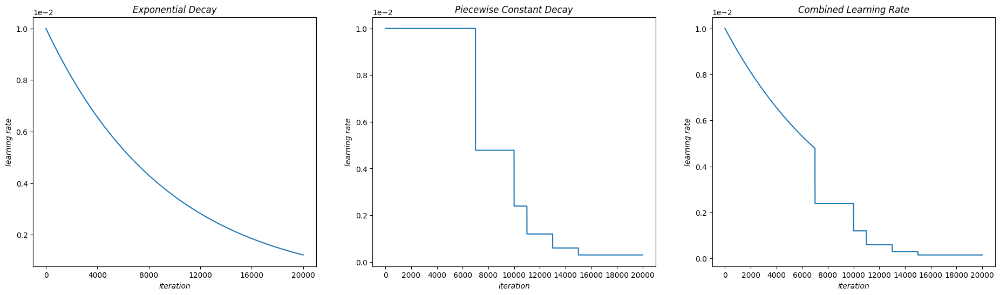

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

N = 20000  # Extended range

fig = plt.figure(figsize=(23, 6))

# ExponentialDecay
initial_learning_rate = lr_comb.initial_learning_rate
decay_steps = lr_comb.decay_steps
decay_rate = lr_comb.decay_rate

learning_rate = []
for i in range(N+1):
    lr = initial_learning_rate * decay_rate ** (i / decay_steps)
    learning_rate.append(lr)

plt.subplot(1, 3, 1)
plt.plot(learning_rate)
plt.xlabel('iteration', fontstyle='italic')
plt.ylabel('learning rate', fontstyle='italic')
plt.xticks(np.arange(0, N+1, 4000))
plt.ticklabel_format(axis='y', scilimits=(0, 0))
plt.title('Exponential Decay', y=1, fontstyle='italic')

# Piecewise Constant Decay
boundaries = lr_comb.boundaries
values = lr_comb.values

learning_rate = []
for i in range(N+1):
    for j in range(len(boundaries)):
        if i <= boundaries[0]:
            lr = lr_comb.initial_learning_rate
        elif i <= boundaries[j]:
            lr = values[j-1]
            break
        else:
            lr = values[-1]
    learning_rate.append(lr)

plt.subplot(1, 3, 2)
plt.plot(learning_rate)
plt.xlabel('iteration', fontstyle='italic')
plt.ylabel('learning rate', fontstyle='italic')
plt.xticks(np.arange(0, N+1, 2000))
plt.ticklabel_format(axis='y', scilimits=(0, 0))
plt.title('Piecewise Constant Decay', y=1, fontstyle='italic')

# Extended Combined Decay
boundaries = lr_comb.boundaries
values_steps = lr_comb.values_steps  # should be a list like [2, 2, 2, ...]
if isinstance(values_steps, int):
    values_steps = [values_steps] * (len(boundaries))  # Make uniform if scalar

i_stop = boundaries[0]
learning_rate = []

learning_rate = []
i_stop = boundaries[0]

for i in range(N+1):
    if i <= i_stop:
        lr = initial_learning_rate * decay_rate ** (i / decay_steps)
    else:
        for j in range(1, len(boundaries)):
            if boundaries[j-1] < i <= boundaries[j]:
                if i == boundaries[j-1] + 1:
                    # first step into this boundary: decay from previous segment
                    prev_lr = learning_rate[-1]
                    lr = prev_lr / values_steps[j-1]
                else:
                    lr = learning_rate[-1]  # maintain constant
                break
        else:
            # After the last boundary
            lr = learning_rate[-1] / values_steps[-1]
    learning_rate.append(lr)

plt.subplot(1, 3, 3)
plt.plot(learning_rate)
plt.xlabel('iteration', fontstyle='italic')
plt.ylabel('learning rate', fontstyle='italic')
plt.xticks(np.arange(0, N+1, 2000))
plt.ticklabel_format(axis='y', scilimits=(0,0))
plt.title('Combined Learning Rate', y=1, fontstyle='italic')



In [13]:
pred_lambda = [0.3219247413509856]


In [ ]:
timeout = 1200
start_from = 1


models_Adam_comb = [None]*n_models
hists_Adam_comb = [None]*n_models
batch_size = 4096

for i in range(start_from - 1, n_models):
    models_Adam_comb[i] = []
    hists_Adam_comb[i] = []
    for j, lambd_val in enumerate(pred_lambda):
        print('{:s}\nModel Iteration: {:d}, Lambda Iteration: {:d}\n{:s}'.format(
            50*'-', i+1, j+1, 50*'-'))

        tf.random.set_seed(i + j)  # Use a combined seed for reproducibility

        # Build and initialize model
        models_Adam_comb[i].append(PINN_NeuralNet(lb, ub, **arch))
        models_Adam_comb[i][j].build(input_shape=(None, 3))

        # Set weights and lambda from base model
        models_Adam_comb[i][j].set_weights(models[i].get_weights())
        # Prepare optimizer
        optim_Adam_comb = tf.keras.optimizers.AdamW(learning_rate=lr_comb, weight_decay =1e-3)

        # Initialize solver
        solver = PINN_PDESolver(models_Adam_comb[i][j], X_train, fun_r_fwd, get_r_fwd,lambd_val)

        # Train the model
        print('\n\nAdam - Combined Learning Rate\n')
        solver.solve_with_TFoptimizer(optim_Adam_comb, X_train, u_train, W_u, W_v,timeout=timeout,batch_size=batch_size)

        # Store training history
        hists_Adam_comb[i].append(solver.hist)

        print('\n\n\n')

--------------------------------------------------
Model Iteration: 1, Lambda Iteration: 1
--------------------------------------------------


Adam - Combined Learning Rate



/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
PDE Loss: 3.20070541e-07 Data Loss: 0.0144207869 Total Loss: 0.144208178
PDE Loss: 3.32522461e-07 Data Loss: 0.0148816667 Total Loss: 0.148817
PDE Loss: 3.29134366e-07 Data Loss: 0.0149507765 Total Loss: 0.149508089
PDE Loss: 3.38562671e-07 Data Loss: 0.0141215008 Total Loss: 0.141215354
PDE Loss: 3.52306557e-07 Data Loss: 0.0146547509 Total Loss: 0.146547869
PDE Loss: 3.37449592e-07 Data Loss: 0.0158495605 Total Loss: 0.158495948
PDE Loss: 3.26409349e-07 Data Loss: 0.0153189059 Total Loss: 0.153189391
PDE Loss: 3.44357431e-07 Data Loss: 0.015543215 Total Loss: 0.155432492
PDE Loss: 3.29416849e-07 Data Loss: 0.0157938283 Total Loss: 0.157938614
PDE Loss: 3.42983952e-07 Data Loss: 0.0148645155 Total Loss: 0.148645505
PDE Loss: 3.39038337e-07 Data Loss: 0.0149220685 Total Loss: 0.149221033
PDE Loss: 3.43547043e-07 Data Loss: 0.0160816964 Total Loss: 0.16081731
PDE Loss: 3.45772207e-07 Data Loss: 0.0174063593 Total Loss: 0.174063936
PDE L

/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net_3', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
PDE Loss: 2.74016799e-07 Data Loss: 0.017105883 Total Loss: 0.171059102
PDE Loss: 3.06343253e-07 Data Loss: 0.0171325095 Total Loss: 0.1713254
PDE Loss: 3.05940659e-07 Data Loss: 0.0169617664 Total Loss: 0.169617981
PDE Loss: 2.92791697e-07 Data Loss: 0.0164319165 Total Loss: 0.164319456
PDE Loss: 2.91671398e-07 Data Loss: 0.0166475214 Total Loss: 0.166475505
PDE Loss: 3.1743059e-07 Data Loss: 0.017728027 Total Loss: 0.17728059
PDE Loss: 2.93761332e-07 Data Loss: 0.0166874863 Total Loss: 0.166875154
PDE Loss: 2.95625142e-07 Data Loss: 0.0153725501 Total Loss: 0.153725803
PDE Loss: 2.8548547e-07 Data Loss: 0.0174737163 Total Loss: 0.174737439
PDE Loss: 3.02113307e-07 Data Loss: 0.0170487314 Total Loss: 0.170487612
PDE Loss: 3.03570715e-07 Data Loss: 0.0174284 Total Loss: 0.174284294
PDE Loss: 3.18708032e-07 Data Loss: 0.0167609211 Total Loss: 0.167609528
PDE Loss: 2.87828982e-07 Data Loss: 0.0181617364 Total Loss: 0.181617647
PDE Loss: 

In [14]:
path = dir + "COModel/Fourier/Softplus_Local_Fourier_swish_fwd/"

In [ ]:
for i in range(n_models):
  for j in range(len(pred_lambda)):
    models_Adam_comb[i][j].save_weights(path+"_"+str(i)+"_model_Adam_comb_"+str(j)+".weights.h5", 'h5')


for i in range(n_models):
  for j in range(len(pred_lambda)):
    np.savetxt(path + "loss/hist_Adam_comb_" + str(i) + "_" + str(j) + ".csv", hists_Adam_comb[i][j], delimiter=",")

In [15]:
n_models = 5


arch = {'output_dim':1, 'num_hidden_layers':5, 'num_neurons_per_layer':100,'activation':'swish', 'trainable_B':True, 'sigmas':[1.0,2.0], 'mapping_size':64}

models = [None] * n_models

for i in range(n_models):
  tf.random.set_seed(i)
  models[i] = PINN_NeuralNet(lb=lb, ub=ub, **arch)
  models[i].build((None, 3))

models_Adam_comb = [None]*n_models # Initialize models_Adam_comb with the correct size

for i in range(0, n_models):
    models_Adam_comb[i] = []
    for j in range(len(pred_lambda)):
        models_Adam_comb[i].append(PINN_NeuralNet(lb, ub, **arch))
        models_Adam_comb[i][j].build(input_shape=(None, 3))
        _ = models_Adam_comb[i][j](tf.zeros((1, 3)))
        models_Adam_comb[i][j].load_weights(
            path + "_" + str(i) + "_model_Adam_comb_" + str(j) + ".weights.h5"
        )


hists_Adam_comb = [None] * n_models

for i in range(0,n_models):
    hists_Adam_comb[i] = []
    for j in range(len(pred_lambda)):
        hists_Adam_comb[i].append(pd.read_csv(path + "/loss/hist_Adam_comb_" + str(i) + "_" + str(j) + ".csv",header=None))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'pinn__neural_net_2', however 

## Grafik Loss

len Atempt-0 Lambda ke- 0:  33
\\
len Atempt-1 Lambda ke- 0:  33
\\
len Atempt-2 Lambda ke- 0:  36
\\
len Atempt-3 Lambda ke- 0:  36
\\
len Atempt-4 Lambda ke- 0:  33
\\


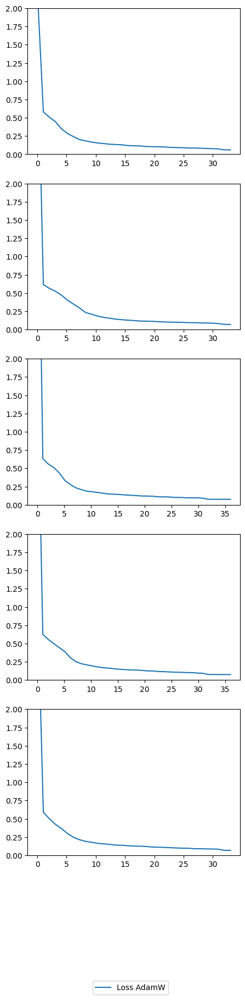

In [ ]:
fig, axes = plt.subplots(nrows=n_models, ncols=len(pred_lambda), figsize=(5,20))

for i in range(n_models):
  for j in range(len(pred_lambda)):
    axes[i].plot(np.linspace(0, len(hists_Adam_comb[i][0]),len(hists_Adam_comb[i][0])), hists_Adam_comb[i][0])
    axes[i].set_ylim([0,2])
  # for j in range(len(pred_lambda)):
  #   axes[j].plot(np.linspace(0, len(hists_Adam_comb[i][j]),len(hists_Adam_comb[i][j])), hists_Adam_comb[i][j])
  #   axes[j].set_ylim([0,5e4])


    print(f"len Atempt-{i} Lambda ke- {j}: ",len(hists_Adam_comb[i][j]))
  print("\\\\")

  rows = ['Attempt {}'.format(row) for row in range(1, n_models+1)]

fig.legend(['Loss AdamW'], loc='lower center', bbox_to_anchor=(0.5, -0.02), ncol=3, frameon=True)

plt.show()

## Prediction and Evaluation

In [ ]:
t_unique = np.sort(test_df['time'].unique())
x_unique = np.sort(test_df['x_coord'].unique())
y_unique = np.sort(test_df['y_coord'].unique())


In [ ]:
lb = tf.constant(lb, dtype=tf.float32)
ub = tf.constant(ub, dtype=tf.float32)

In [ ]:
train_Adam_comb = []


t_unique_train = np.sort(train_df['time'].unique())
x_unique_train = np.sort(train_df['x_coord'].unique())
y_unique_train = np.sort(train_df['y_coord'].unique())


for i in range(n_models):
  for j in range(len(pred_lambda)):
    train_Adam_comb.append(predict_solution(models_Adam_comb[i][j], X_train, t_unique_train, x_unique_train, y_unique_train))


df = pd.DataFrame(columns=['Adam'])
initial_lambdas = pred_lambda

# Evaluate and populate the DataFrame
for i in range(n_models):
    results = []
    for j in range(len(initial_lambdas)):
        # Evaluate solutions
        # eval_sgd = pinn.evaluate_solution(preds_SGD[i * len(initial_lambdas) + j], u_star)
        pred_t0 = train_Adam_comb[i * len(initial_lambdas) + j]
        eval_adam = evaluate_solution(pred_t0.numpy(), u_train.numpy())

        # Append results for each lambda
        # results.append(eval_sgd)
        results.append(eval_adam)

    # Add results to DataFrame
    df.loc[f'Attempt {i+1}'] = results

# Display the DataFrame
df


,Adam
Attempt 1,"(0.05914265, 1.7368221)"
Attempt 2,"(0.064912386, 1.9022495)"
Attempt 3,"(0.06684283, 1.9626915)"
Attempt 4,"(0.06755668, 1.9875274)"
Attempt 5,"(0.06335204, 1.8512992)"


In [ ]:
t_unique = np.sort(test_df['time'].unique())
x_unique = np.sort(test_df['x_coord'].unique())
y_unique = np.sort(test_df['y_coord'].unique())

preds_Adam_comb = []

for i in range(n_models):
  for j in range(len(pred_lambda)):
    preds_Adam_comb.append(predict_solution(models_Adam_comb[i][j], X_test, t_unique, x_unique, y_unique))


In [ ]:
df = pd.DataFrame(columns=['Adam'])
initial_lambdas = pred_lambda

# Evaluate and populate the DataFrame
for i in range(n_models):
    results = []
    for j in range(len(initial_lambdas)):
        # Evaluate solutions
        # eval_sgd = pinn.evaluate_solution(preds_SGD[i * len(initial_lambdas) + j], u_star)
        pred_t0 = preds_Adam_comb[i * len(initial_lambdas) + j]
        eval_adam = evaluate_solution(pred_t0.numpy(), u_test.numpy())

        # Append results for each lambda
        # results.append(eval_sgd)
        results.append(eval_adam)

    # Add results to DataFrame
    df.loc[f'Attempt {i+1}'] = results

# Display the DataFrame
df


,Adam
Attempt 1,"(0.059807334, 1.7560769)"
Attempt 2,"(0.06552462, 1.9197159)"
Attempt 3,"(0.067316756, 1.975953)"
Attempt 4,"(0.06784095, 1.9953215)"
Attempt 5,"(0.06388293, 1.866838)"


In [ ]:
def summarise_attempts(df: pd.DataFrame) -> pd.DataFrame:
    """
    Return a tidy table with mean, sample‑SD and CV
    for both numbers contained in each tuple cell.
    """
    summaries = {}
    for col in df.columns:
        arr = np.vstack(df[col].to_numpy())     # shape = (n_attempts, 2)
        μ  = arr.mean(axis=0)                   # mean
        σ  = arr.std(axis=0, ddof=1)            # sample SD (ddof=1)
        cv = σ / μ                              # coefficient of variation
        summaries[col] = {
            "mean_MAE": μ[0], "sd_MAE": σ[0], "cv_MAE": cv[0],
            "mean_MAPE": μ[1], "sd_MAPE": σ[1], "cv_MAPE": cv[1],
        }
    return pd.DataFrame(summaries).T

stats_df = summarise_attempts(df)
print(stats_df)

      mean_MAE    sd_MAE    cv_MAE  mean_MAPE   sd_MAPE   cv_MAPE
Adam  0.064875  0.003234  0.049857   1.902781  0.096201  0.050558


In [ ]:
weights = models_Adam_comb[0][0].get_weights()

for i, w in enumerate(weights):
    print(f"Weight {i}: shape = {w.shape}")
    print(w)

Weight 0: shape = (3, 64)
[[ 0.9984573  -0.12642097  2.07368    -0.15695818  2.230358    0.41407564
  -3.3238492  -0.5861211   1.7635493   0.71074843  0.17968108 -0.9803879
  -0.7271961   0.85473984  0.08074281 -0.4613719   1.4586443   0.09721474
  -2.1722999  -1.0615214   0.35954714 -0.54549557  0.97547907  0.15487844
   2.0628078   0.74429196  0.8835027  -2.135232    0.3189654  -2.145564
   0.5019139   1.6990255  -2.0158582   0.9725864  -0.6345117  -2.1817682
  -0.04916771  0.9162932  -0.31918886  0.26118398 -1.056334    0.06295849
   0.39008537 -1.8179504  -1.195648    0.54728186  0.90815645 -0.3173947
   1.0949419  -0.31213343 -0.7735033   1.2020372   1.3681114  -0.28671265
   0.02498269  0.6305999   0.42788804  1.2729236  -2.4809575   2.0181053
  -0.49535194 -1.3957764  -0.5537211  -0.05795855]
 [-0.7393709  -0.26576087  1.6588495  -0.7776226   1.7438732  -0.549961
  -0.1370772   2.0980957  -0.3328691  -0.9220854   0.99421453 -0.5429383
  -1.440461    2.2329407  -0.15950286 -2.341

# Rekonstruksi atau Imputasi

# Imputasi

In [16]:
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
import matplotlib as mpl
import matplotlib.patheffects as pe

df = pd.read_csv("/content/drive/My Drive/TA/Dataset/Localized/CO_Land_Grid_Jabodetabek.csv")
df['date'] = pd.to_datetime(df['date'])
start_date = datetime(2023, 5, 1)
indonesia = gpd.read_file('https://geodata.ucdavis.edu/gadm/gadm4.1/json/gadm41_IDN_2.json')

df=df.rename(columns={"mean":"CO_mean","latitude":"y_coord","longitude":"x_coord"})
df['time'] = (df['date'] - df['date'].min()).dt.days
df.x_coord = df.x_coord*100
df.y_coord = df.y_coord*100

In [17]:
missing_rows = df[(df["CO_mean"].isna()) | (df["CO_mean"] < 0)][["time", "x_coord", "y_coord"]]
missing_rows

,time,x_coord,y_coord
0,0,10635.333441,-611.069755
1,0,10635.274668,-610.351014
2,0,10635.284913,-608.898477
3,0,10634.867379,-607.772079
4,0,10634.777381,-606.702390
...,...,...,...
2223505,729,10722.063803,-638.785742
2223526,729,10723.652998,-630.705852
2223572,729,10726.838924,-611.789723
2223573,729,10728.320745,-622.629965


In [18]:
# --- Convert to numpy for model input ---
X_missing = missing_rows.to_numpy(dtype=np.float32)

# --- Predict using your model ---
y_pred = models_Adam_comb[0][0].predict_on_batch(X_missing).reshape(-1)
y_pred = y_pred*1e-2
df.x_coord = df.x_coord/100
df.y_coord = df.y_coord/100
df_imputation = df.copy()

# --- Fill missing values ---
df_imputation.loc[(df_imputation["CO_mean"].isna()) | (df_imputation["CO_mean"] < 0), "CO_mean"] = y_pred


In [19]:
df_imputation.describe()

,date,CO_mean,x_coord,y_coord,time
count,2223580,2.223580e+06,2.223580e+06,2.223580e+06,2.223580e+06
mean,2024-04-29 12:00:00.000003328,3.401998e-02,1.068074e+02,-6.374133e+00,3.645000e+02
min,2023-05-01 00:00:00,1.393031e-02,1.063478e+02,-6.782034e+00,0.000000e+00
25%,2023-10-30 00:00:00,2.923160e-02,1.065988e+02,-6.547693e+00,1.820000e+02
50%,2024-04-29 12:00:00,3.272970e-02,1.068033e+02,-6.362443e+00,3.645000e+02
75%,2024-10-29 00:00:00,3.765575e-02,1.070234e+02,-6.201893e+00,5.470000e+02
max,2025-04-29 00:00:00,7.176243e-02,1.072891e+02,-5.920041e+00,7.290000e+02
std,NaN,6.730637e-03,2.437598e-01,2.086174e-01,2.107327e+02


In [20]:
#FILTERED DATA
df.x_coord = df.x_coord*100
df.y_coord = df.y_coord*100

unique_coords = df[['time','x_coord', 'y_coord']].drop_duplicates()

df.x_coord = df.x_coord/100
df.y_coord = df.y_coord/100

# Merge with the filtered_df to check presence of CO_filtered
merged = unique_coords.merge(filtered_df[['time', 'x_coord', 'y_coord', 'CO_filtered']],
                          on=['time', 'x_coord', 'y_coord'],
                          how='left')

# Select only the rows where CO_filtered is missing
missing_rows = merged[merged['CO_filtered'].isna()].drop(columns='CO_filtered')

# Result: only (time, x_coord, y_coord) with missing CO_filtered
missing_rows

# --- Predict using your model ---
X_missing_filtered = missing_rows[['time', 'x_coord', 'y_coord']].values
y_pred = models_Adam_comb[0][0].predict_on_batch(X_missing_filtered).reshape(-1)

df_filtered_imputation = filtered_df[["time","x_coord","y_coord","CO_filtered"]]
missing_rows['CO_filtered'] = y_pred

# Merge predicted values back into original dataframe
df_filtered_imputation = pd.concat([df_filtered_imputation, missing_rows],axis=0)

df_filtered_imputation.describe()

,time,x_coord,y_coord,CO_filtered
count,2.223580e+06,2.223580e+06,2.223580e+06,2.223580e+06
mean,3.645000e+02,1.068074e+04,-6.374133e+02,3.401844e+00
std,2.107327e+02,2.437598e+01,2.086174e+01,6.202959e-01
min,0.000000e+00,1.063478e+04,-6.782034e+02,1.985860e+00
25%,1.820000e+02,1.065988e+04,-6.547693e+02,2.955218e+00
50%,3.645000e+02,1.068033e+04,-6.362443e+02,3.283419e+00
75%,5.470000e+02,1.070234e+04,-6.201893e+02,3.739553e+00
max,7.290000e+02,1.072891e+04,-5.920041e+02,6.517823e+00


In [21]:
df_filtered_imputation.to_csv("Imputation_FilteredData_CO_Jabodetabek_M3_Swish+Softplus.csv")

In [23]:
df_filtered_imputation

,time,x_coord,y_coord,CO_filtered
0,0,106.362972,-6.066043,3.370741
1,0,106.362972,-6.078393,3.370741
2,0,106.362972,-6.053693,3.370741
3,0,106.362972,-6.090743,3.370741
4,0,106.362972,-6.103093,3.397441
...,...,...,...,...
2223505,729,107.220638,-6.387857,2.900897
2223526,729,107.236530,-6.307059,3.073724
2223572,729,107.268389,-6.117897,3.067161
2223573,729,107.283207,-6.226300,3.186898


In [ ]:
df_filtered_imputation.x_coord = df_filtered_imputation.x_coord/100
df_filtered_imputation.y_coord = df_filtered_imputation.y_coord/100
df_filtered_imputation.CO_filtered = df_filtered_imputation.CO_filtered*scale

df_filter = filtered_df.copy()
df_filter.x_coord = df_filter.x_coord/100
df_filter.y_coord = df_filter.y_coord/100

df_filter.CO_filtered = df_filter.CO_filtered*scale

In [28]:
df_filtered_imputation = df_filtered_imputation.sort_values(
    by=['time', 'x_coord', 'y_coord']
).reset_index(drop=True)

In [29]:
df_filtered_imputation

,time,x_coord,y_coord,CO_filtered
0,0,106.347774,-6.067024,0.033132
1,0,106.348674,-6.077721,0.033468
2,0,106.352747,-6.103510,0.034241
3,0,106.352803,-6.054635,0.032919
4,0,106.352849,-6.088985,0.033904
...,...,...,...,...
2223575,729,107.286299,-6.151964,0.029925
2223576,729,107.287021,-6.190315,0.029925
2223577,729,107.287719,-6.202429,0.032162
2223578,729,107.288205,-6.212286,0.032162


# Rekonstruksi

In [ ]:
import numpy as np
import pandas as pd
import math
import os
from google.colab import files
from concurrent.futures import ThreadPoolExecutor

# --- 1. Load data dan siapkan grid (1e-4 spacing) ---

# Misal Anda sudah memiliki filtered_df
# Jika belum, upload:
# uploaded = files.upload()
# filtered_df = pd.read_csv("filtered_df.csv")

step = 0.5 # Resolusi

t_min, t_max = filtered_df["time"].min(), filtered_df["time"].max()
x_min, x_max = filtered_df["x_coord"].min(), filtered_df["x_coord"].max()
y_min, y_max = filtered_df["y_coord"].min(), filtered_df["y_coord"].max()

t_points = np.arange(t_min, t_max + step, 1, dtype=np.float32)
x_points = np.arange(x_min, x_max + step, step, dtype=np.float32)
y_points = np.arange(y_min, y_max + step, step, dtype=np.float32)


# --- 2. Pilih model dan path hasil ---
target_indices = [(0, 0)]
models_to_use  = [models_Adam_comb[i][j] for i, j in target_indices]
model_labels   = [f"m{i}_{j}" for i, j in target_indices]
file_paths     = [f"/content/Softplus_CO_Local_M3_swish_prediction_{label}.csv" for label in model_labels]

# --- 3. Buat file output kosong dengan header ---
for path in file_paths:
    if os.path.exists(path):
        os.remove(path)
    with open(path, "w") as f:
        f.write("t,x,y,prediction\n")

# --- 4. Precompute spatial meshgrid (xy pairs) sekali saja ---
xy_pairs = np.stack(np.meshgrid(x_points, y_points, indexing="ij"), -1).reshape(-1, 2)

# --- 5. Fungsi batch generator ---
def gen_batches(t_vec, batch_size=1_000_000):
    for t in t_vec:
        t_col = np.full((xy_pairs.shape[0], 1), t, dtype=np.float32)
        tx_y = np.hstack([t_col, xy_pairs])
        n_rows = tx_y.shape[0]
        n_batch = math.ceil(n_rows / batch_size)
        for k in range(n_batch):
            yield t, tx_y[k * batch_size : (k + 1) * batch_size]

# --- 6. Fungsi prediksi + tulis ke file ---
def predict_and_write(model, batch, path):
    pred = model.predict_on_batch(batch).reshape(-1, 1)
    output = np.hstack([batch, pred])
    df = pd.DataFrame(output, columns=["t", "x", "y", "prediction"])
    df.to_csv(path, mode="a", header=False, index=False, float_format="%.6g")

# --- 7. Loop utama: batch per waktu + paralel tulis model ---
for t_val, batch in gen_batches(t_points):
    print(f"Processing time: {t_val}, Batch shape: {batch.shape}")
    with ThreadPoolExecutor() as executor:
        for model, path in zip(models_to_use, file_paths):
            executor.submit(predict_and_write, model, batch, path)

Processing time: 0.0, Batch shape: (32300, 3)
Processing time: 1.0, Batch shape: (32300, 3)
Processing time: 2.0, Batch shape: (32300, 3)
Processing time: 3.0, Batch shape: (32300, 3)
Processing time: 4.0, Batch shape: (32300, 3)
Processing time: 5.0, Batch shape: (32300, 3)
Processing time: 6.0, Batch shape: (32300, 3)
Processing time: 7.0, Batch shape: (32300, 3)
Processing time: 8.0, Batch shape: (32300, 3)
Processing time: 9.0, Batch shape: (32300, 3)
Processing time: 10.0, Batch shape: (32300, 3)
Processing time: 11.0, Batch shape: (32300, 3)
Processing time: 12.0, Batch shape: (32300, 3)
Processing time: 13.0, Batch shape: (32300, 3)
Processing time: 14.0, Batch shape: (32300, 3)
Processing time: 15.0, Batch shape: (32300, 3)
Processing time: 16.0, Batch shape: (32300, 3)
Processing time: 17.0, Batch shape: (32300, 3)
Processing time: 18.0, Batch shape: (32300, 3)
Processing time: 19.0, Batch shape: (32300, 3)
Processing time: 20.0, Batch shape: (32300, 3)
Processing time: 21.0, 

In [ ]:
dir

'/content/drive/My Drive/TA/'

In [ ]:
# prediction_df =pd.read_csv(dir+"Reconstruction/CO_Local/CO_Local_M3_swish_prediction_m4_0.csv")
prediction_df =pd.read_csv("/content/Softplus_CO_Local_M3_swish_prediction_m0_0.csv")

prediction_cleaned_df =prediction_df.copy()
prediction_cleaned_df['prediction'] = prediction_df['prediction'].apply(lambda x: 0 if x < 0 else x)
prediction_df['prediction']= prediction_df['prediction']*1e-2
prediction_df['x'] = prediction_df['x']/100
prediction_df['y'] = prediction_df['y']/100

In [ ]:
prediction_df

,t,x,y,prediction
0,0,106.348,-6.78203,0.027043
1,0,106.348,-6.77703,0.027012
2,0,106.348,-6.77203,0.026955
3,0,106.348,-6.76703,0.026873
4,0,106.348,-6.76203,0.026768
...,...,...,...,...
23578995,729,107.293,-5.95703,0.032211
23578996,729,107.293,-5.95203,0.032306
23578997,729,107.293,-5.94703,0.032394
23578998,729,107.293,-5.94203,0.032468


In [ ]:
prediction_df.describe()

,t,x,y,prediction
count,2.357900e+07,2.357900e+07,2.357900e+07,2.357900e+07
mean,3.645000e+02,1.068205e+02,-6.359530e+00,3.380589e-02
std,2.107327e+02,2.742376e-01,2.453696e-01,6.241138e-03
min,0.000000e+00,1.063480e+02,-6.782030e+00,1.285920e-02
25%,1.820000e+02,1.065830e+02,-6.572030e+00,2.937150e-02
50%,3.645000e+02,1.068205e+02,-6.359530e+00,3.255240e-02
75%,5.470000e+02,1.070580e+02,-6.147030e+00,3.720180e-02
max,7.290000e+02,1.072930e+02,-5.937030e+00,6.475730e-02


# Kebakaran Tambora (10 Oktober 2024)

t = 528


/tmp/ipython-input-2540635651.py:39: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  jawa['centroid'] = jawa.geometry.centroid
/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipython-input-2540635651.py:67: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-in

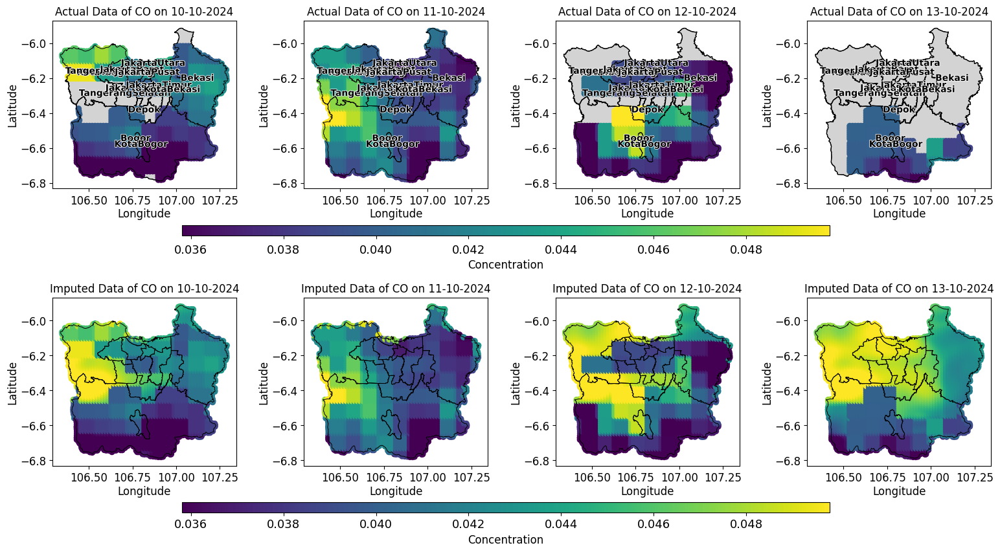

In [30]:
from matplotlib.colors import LinearSegmentedColormap

viridis = plt.cm.viridis(np.linspace(0, 1, 256))
# Define a smooth gradient from yellow to orange to red (HSV-based blending)
yellow_to_red = np.array([
    [253/255, 231/255, 37/255, 1],  # #FDE725
    [1.0, 0.65, 0.0, 1.0],  # orange
    [1.0, 0.0, 0.0, 1.0]    # red
])
n_extend = int(256 * 0.25)

colors = np.vstack((
    viridis,
    np.linspace(yellow_to_red[0], yellow_to_red[-1], n_extend)
))

# Create the final colormap
viridis_to_red = LinearSegmentedColormap.from_list(
    "viridis_yellow_orange_red", colors
)


# --- Step 2: Input your target date ---
target_day = 10
target_month = 10
target_year = 2024
target_date = datetime(target_year, target_month, target_day)

t = (target_date - start_date).days
print("t =", t)

# --- Step 3: Load Indonesia shapefile ---

jawa_provinces = ['Tangerang', 'Bogor', 'KotaTangerang', 'JakartaBarat',
       'JakartaUtara', 'JakartaSelatan', 'KotaBogor',
       'Depok', 'JakartaPusat', 'JakartaTimur', 'Bekasi',
       'KotaBekasi','TangerangSelatan']
jawa = indonesia[indonesia['NAME_2'].isin(jawa_provinces)]
jawa['centroid'] = jawa.geometry.centroid

# --- Step 4: Define the offsets you want to compare ---
day_offsets = [0,1,2,3]

# --- Step 5: Setup figure (rows = dates, cols = 2 for df & df_imputation) ---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Actual Data": None, "Imputed Data": None}
vmin, vmax = 0.0358, 0.0498

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Actual Data"), (df_imputation, "Imputed Data")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
                cmap='viridis',
                vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Actual Data":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} of CO on {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Longitude", fontsize=12, labelpad=2)
        ax.set_ylabel("Latitude", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Concentration", fontsize=12)
cbar1.ax.tick_params(labelsize=13,pad=6)

sm2 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Concentration", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


t = 528


/tmp/ipython-input-3795616180.py:39: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  jawa['centroid'] = jawa.geometry.centroid
/usr/local/lib/python3.12/dist-packages/geopandas/geodataframe.py:1968: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/ipython-input-3795616180.py:67: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-in

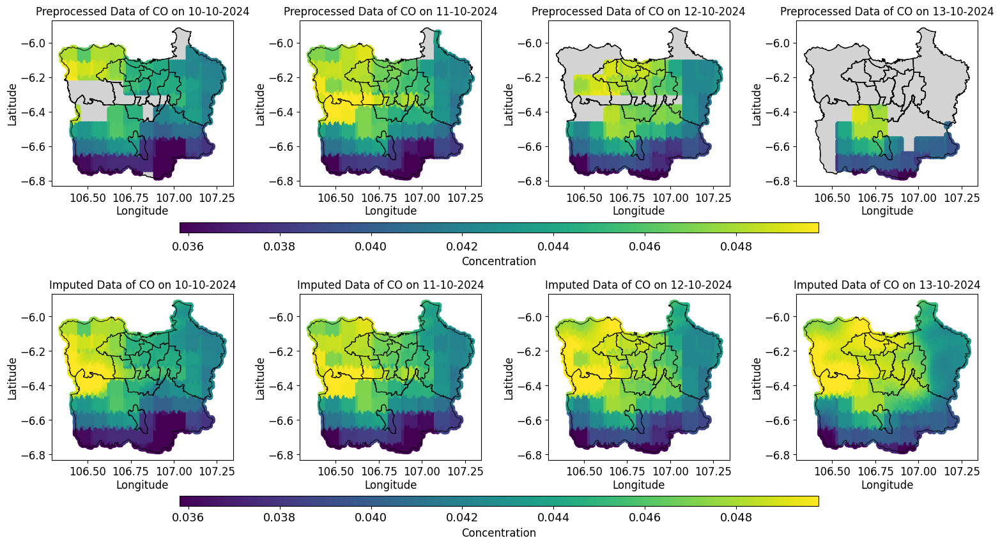

In [31]:
# @title
from matplotlib.colors import LinearSegmentedColormap

viridis = plt.cm.viridis(np.linspace(0, 1, 256))
# Define a smooth gradient from yellow to orange to red (HSV-based blending)
yellow_to_red = np.array([
    [253/255, 231/255, 37/255, 1],  # #FDE725
    [1.0, 0.65, 0.0, 1.0],  # orange
    [1.0, 0.0, 0.0, 1.0]    # red
])
n_extend = int(256 * 0.25)

colors = np.vstack((
    viridis,
    np.linspace(yellow_to_red[0], yellow_to_red[-1], n_extend)
))

# Create the final colormap
viridis_to_red = LinearSegmentedColormap.from_list(
    "viridis_yellow_orange_red", colors
)


# --- Step 2: Input your target date ---
target_day = 10
target_month = 10
target_year = 2024
target_date = datetime(target_year, target_month, target_day)

t = (target_date - start_date).days
print("t =", t)

# --- Step 3: Load Indonesia shapefile ---

jawa_provinces = ['Tangerang', 'Bogor', 'KotaTangerang', 'JakartaBarat',
       'JakartaUtara', 'JakartaSelatan', 'KotaBogor',
       'Depok', 'JakartaPusat', 'JakartaTimur', 'Bekasi',
       'KotaBekasi','TangerangSelatan']
jawa = indonesia[indonesia['NAME_2'].isin(jawa_provinces)]
jawa['centroid'] = jawa.geometry.centroid

# --- Step 4: Define the offsets you want to compare ---
day_offsets = [0,1,2,3]

# --- Step 5: Setup figure (rows = dates, cols = 2 for df & df_imputation) ---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Actual Data": None, "Imputed Data": None}
vmin, vmax = 0.0358, 0.0498

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df_filter, "Preprocessed Data"), (df_filtered_imputation, "Imputed Data")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_filtered', ax=ax,
                cmap='viridis',
                vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Actual Data":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} of CO on {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Longitude", fontsize=12, labelpad=2)
        ax.set_ylabel("Latitude", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Concentration", fontsize=12)
cbar1.ax.tick_params(labelsize=13,pad=6)

sm2 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Concentration", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-608280867.py:24: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-608280867.py:24: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-608280867.py:24: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-608280867

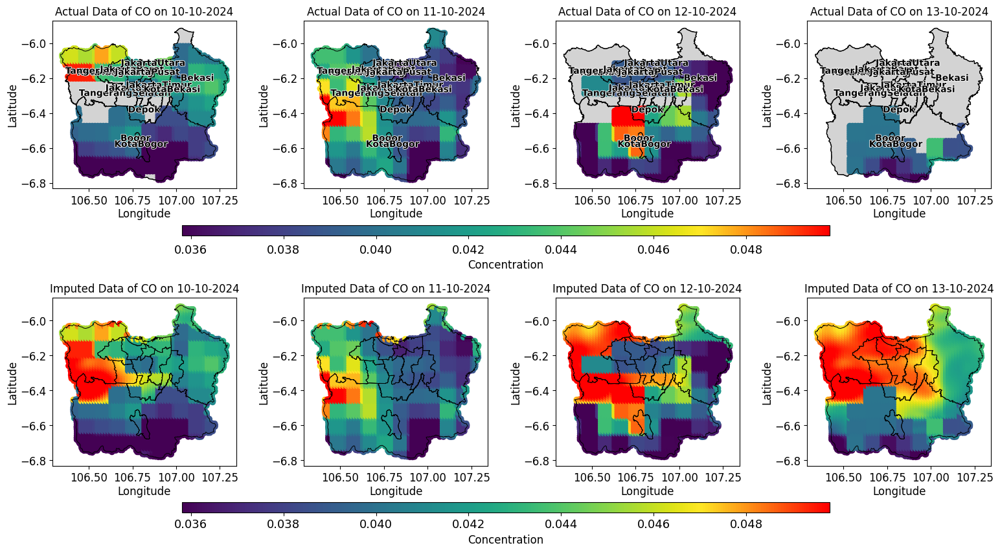

In [ ]:
# @title
# --- Step 5: Setup figure (rows = dates, cols = 2 for df & df_imputation) ---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Actual Data": None, "Imputed Data": None}
vmin, vmax = 0.0358, 0.0498

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Actual Data"), (df_imputation, "Imputed Data")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
                cmap= viridis_to_red,
                vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Actual Data":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} of CO on {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Longitude", fontsize=12, labelpad=2)
        ax.set_ylabel("Latitude", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Concentration", fontsize=12)
cbar1.ax.tick_params(labelsize=13,pad=6)

sm2 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Concentration", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-4092660697.py:24: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-4092660697.py:24: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-4092660697.py:24: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-409266

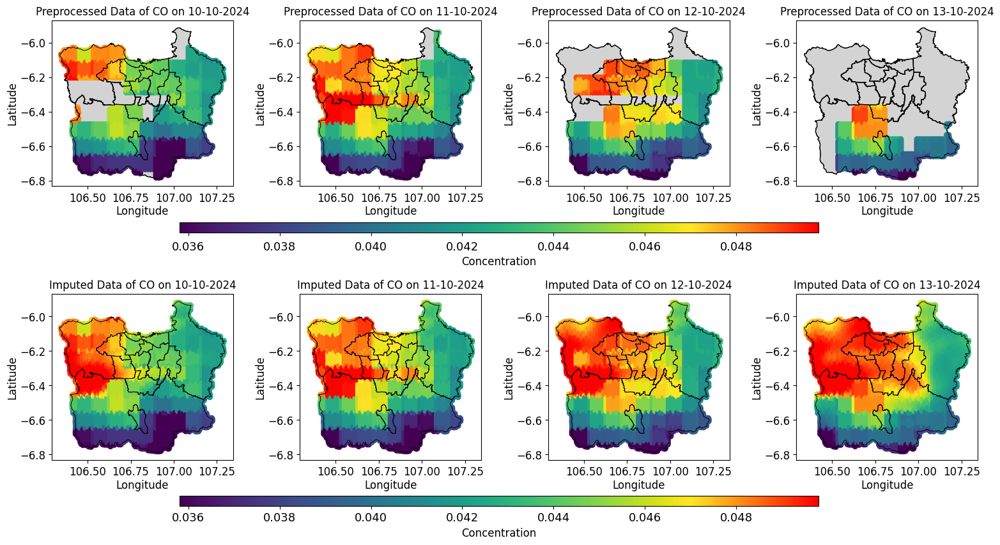

In [32]:
# @title
# --- Step 5: Setup figure (rows = dates, cols = 2 for df & df_imputation) ---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Actual Data": None, "Imputed Data": None}
vmin, vmax = 0.0358, 0.0498

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df_filter, "Preprocessed Data"), (df_filtered_imputation, "Imputed Data")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_filtered', ax=ax,
                cmap= viridis_to_red,
                vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Actual Data":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} of CO on {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Longitude", fontsize=12, labelpad=2)
        ax.set_ylabel("Latitude", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Concentration", fontsize=12)
cbar1.ax.tick_params(labelsize=13,pad=6)

sm2 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Concentration", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-539069100.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-539069100.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-539069100.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-539069100

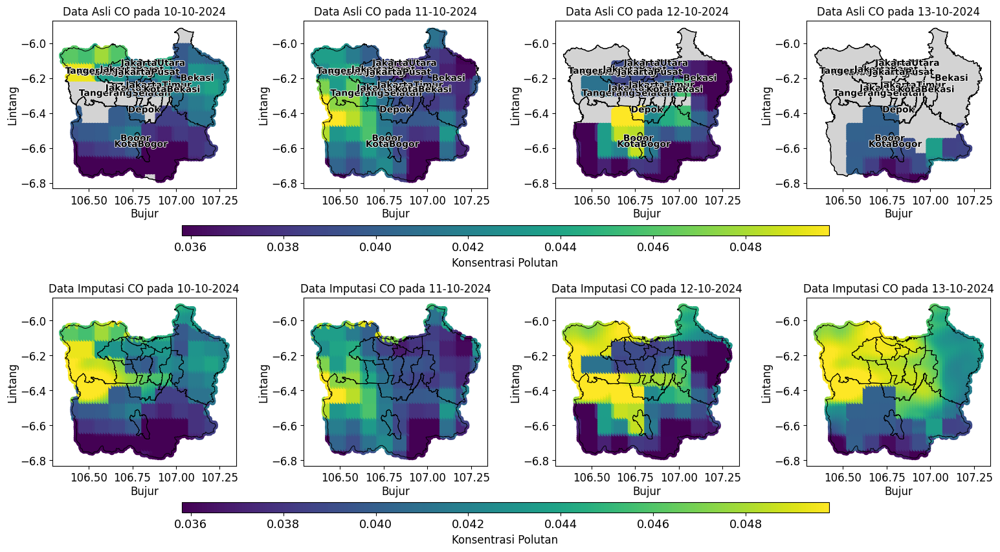

In [ ]:
# @title
# --- Step 5: Setup figure---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Data Asli": None, "Data Imputasi": None}

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Data Asli"), (df_imputation, "Data Imputasi")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
               cmap='viridis',
              vmin=vmin, vmax=vmax

            )
            mappables[label] = mappable

        # City names
        if label == "Data Asli":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} CO pada {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Bujur", fontsize=12, labelpad=2)
        ax.set_ylabel("Lintang", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Konsentrasi Polutan", fontsize=12)
cbar1.ax.tick_params(labelsize=13)

sm2 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Konsentrasi Polutan", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-815507787.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-815507787.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-815507787.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-815507787

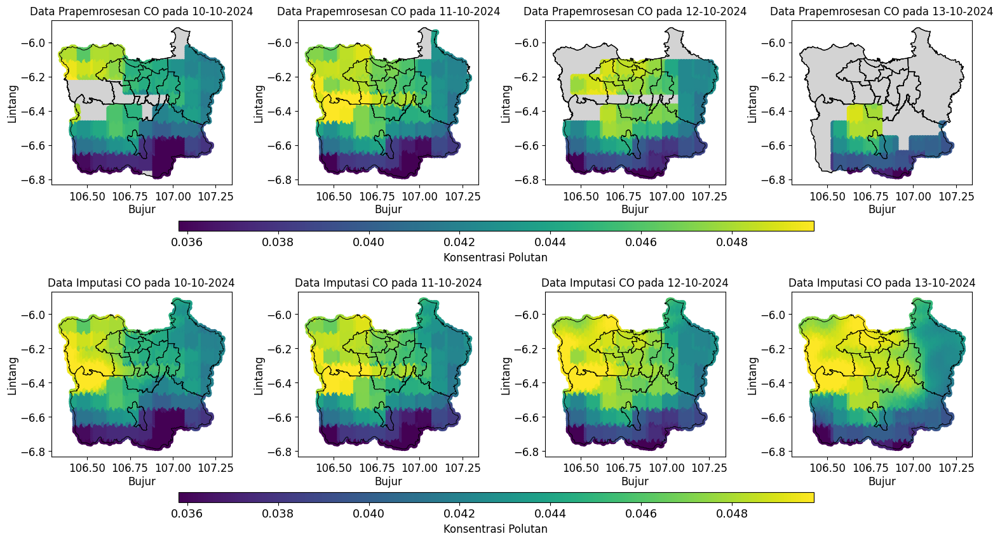

In [33]:
# @title
# --- Step 5: Setup figure---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Data Asli": None, "Data Imputasi": None}

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df_filter, "Data Prapemrosesan"), (df_filtered_imputation, "Data Imputasi")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_filtered', ax=ax,
               cmap='viridis',
              vmin=vmin, vmax=vmax

            )
            mappables[label] = mappable

        # City names
        if label == "Data Asli":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} CO pada {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Bujur", fontsize=12, labelpad=2)
        ax.set_ylabel("Lintang", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Konsentrasi Polutan", fontsize=12)
cbar1.ax.tick_params(labelsize=13)

sm2 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Konsentrasi Polutan", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-996837555.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-996837555.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-996837555.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-996837555

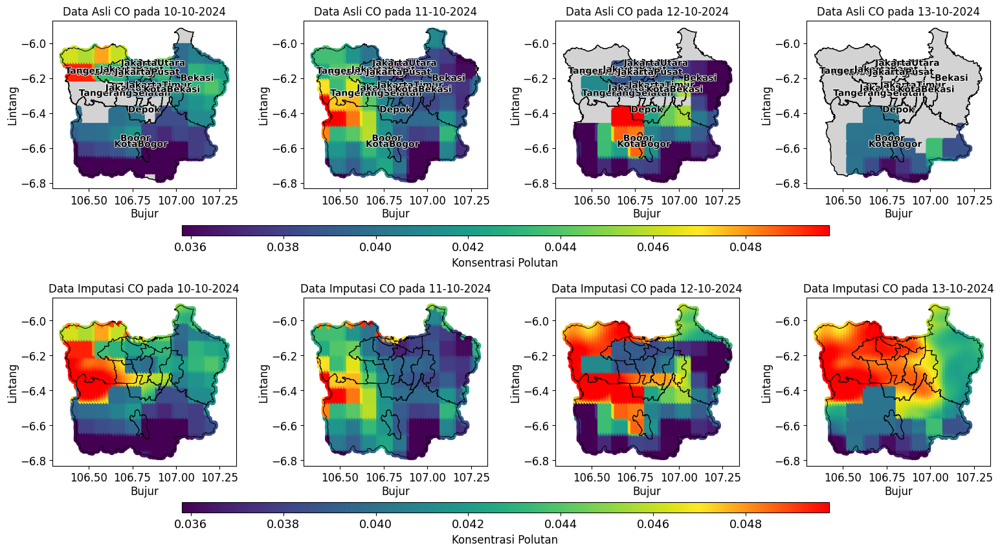

In [ ]:
# @title
# --- Step 5: Setup figure---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Data Asli": None, "Data Imputasi": None}

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Data Asli"), (df_imputation, "Data Imputasi")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
               cmap=viridis_to_red,
              vmin=vmin, vmax=vmax

            )
            mappables[label] = mappable

        # City names
        if label == "Data Asli":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} CO pada {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Bujur", fontsize=12, labelpad=2)
        ax.set_ylabel("Lintang", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Konsentrasi Polutan", fontsize=12)
cbar1.ax.tick_params(labelsize=13)

sm2 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Konsentrasi Polutan", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-4009278880.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-4009278880.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-4009278880.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-400927

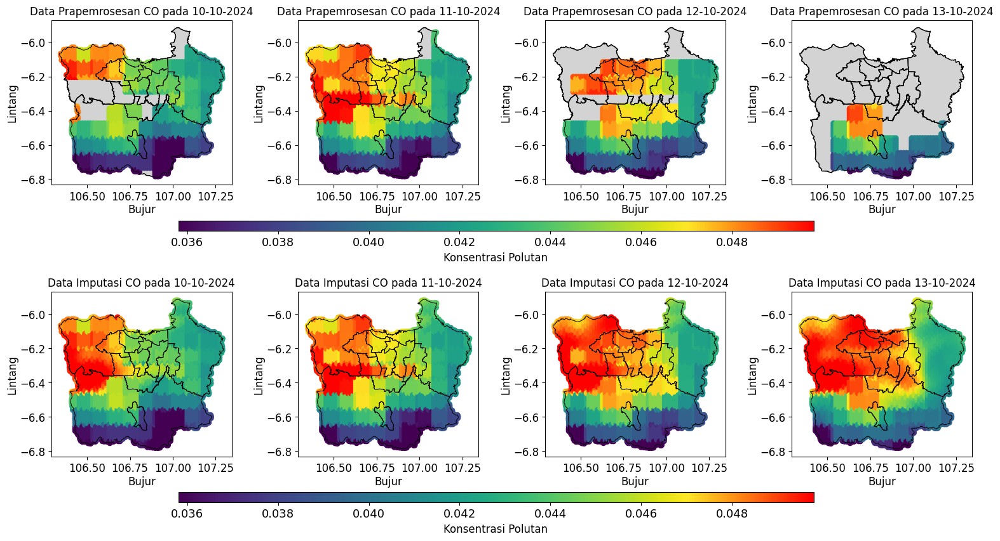

In [35]:
# @title
  # --- Step 5: Setup figure---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Data Asli": None, "Data Imputasi": None}

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df_filter, "Data Prapemrosesan"), (df_filtered_imputation, "Data Imputasi")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_filtered', ax=ax,
               cmap=viridis_to_red,
              vmin=vmin, vmax=vmax

            )
            mappables[label] = mappable

        # City names
        if label == "Data Asli":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} CO pada {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Bujur", fontsize=12, labelpad=2)
        ax.set_ylabel("Lintang", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Konsentrasi Polutan", fontsize=12)
cbar1.ax.tick_params(labelsize=13)

sm2 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Konsentrasi Polutan", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()





/tmp/ipython-input-2425321271.py:32: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-2425321271.py:32: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-2425321271.py:32: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-242532

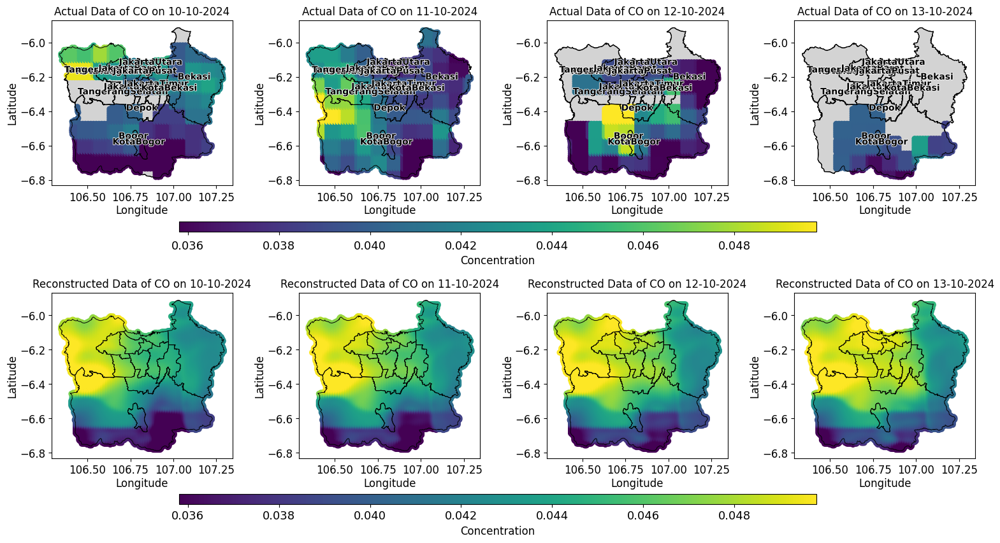

In [ ]:
# @title

predict = prediction_df.copy()
predict = predict.rename(columns={'prediction':'CO_mean','t':'time','x':'x_coord','y':'y_coord'})


# --- Step 4: Define the offsets you want to compare ---
day_offsets = [0,1,2,3]


# --- Step 5: Setup figure (rows = dates, cols = 2 for df & df_imputation) ---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Actual Data": None, "Reconstructed Data": None}


for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Actual Data"), (predict, "Reconstructed Data")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
                cmap='viridis',
                vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Actual Data":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} of CO on {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Longitude", fontsize=12, labelpad=2)
        ax.set_ylabel("Latitude", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Concentration", fontsize=12)
cbar1.ax.tick_params(labelsize=13,pad=6)

sm2 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Concentration", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-1491480193.py:32: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-1491480193.py:32: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-1491480193.py:32: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-149148

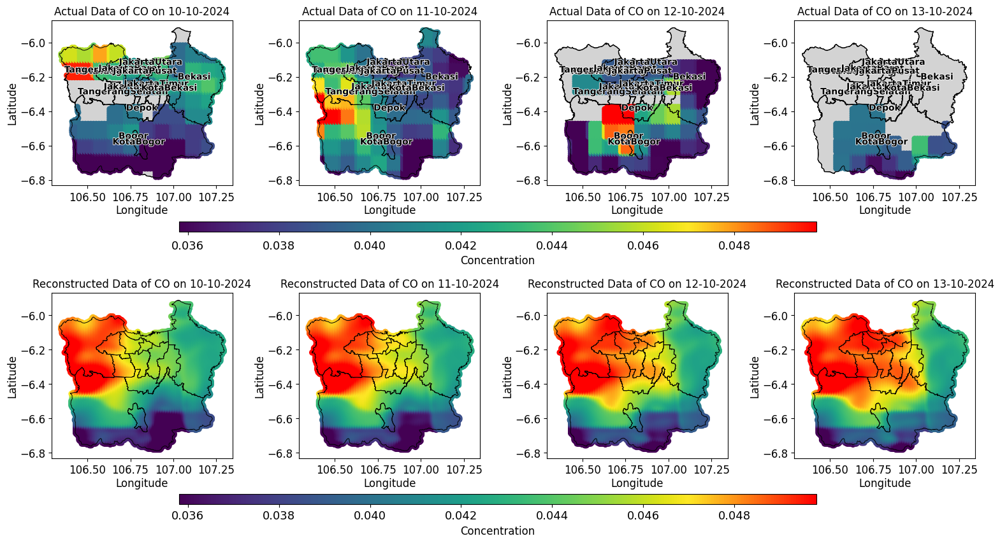

In [ ]:
# @title

predict = prediction_df.copy()
predict = predict.rename(columns={'prediction':'CO_mean','t':'time','x':'x_coord','y':'y_coord'})


# --- Step 4: Define the offsets you want to compare ---
day_offsets = [0,1,2,3]


# --- Step 5: Setup figure (rows = dates, cols = 2 for df & df_imputation) ---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Actual Data": None, "Reconstructed Data": None}


for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Actual Data"), (predict, "Reconstructed Data")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
                cmap=viridis_to_red,
                vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Actual Data":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} of CO on {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Longitude", fontsize=12, labelpad=2)
        ax.set_ylabel("Latitude", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Concentration", fontsize=12)
cbar1.ax.tick_params(labelsize=13,pad=6)

sm2 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Concentration", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-100855278.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-100855278.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-100855278.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-100855278

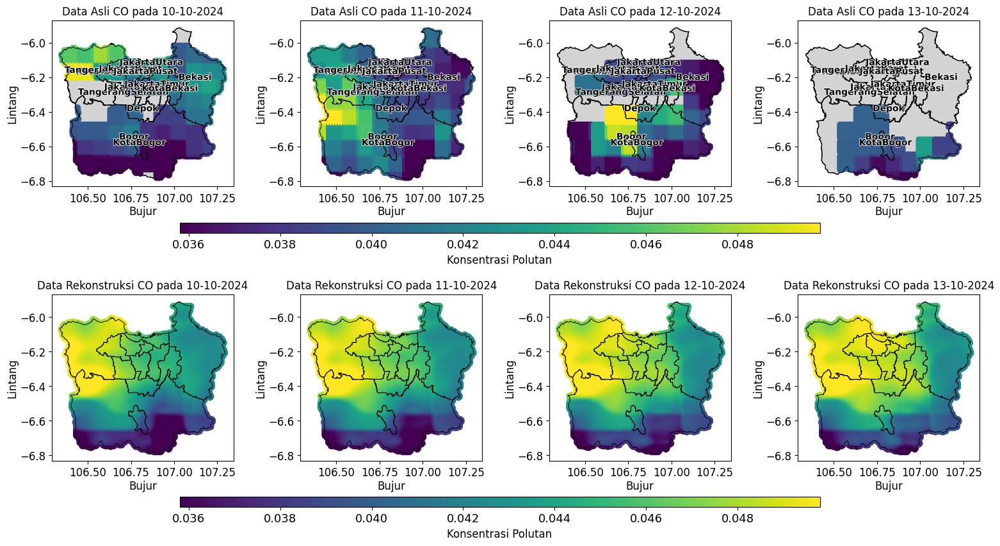

In [ ]:
# @title
# --- Step 5: Setup figure---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Data Asli": None, "Data Rekonstruksi": None}

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Data Asli"), (predict, "Data Rekonstruksi")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
                cmap='viridis', vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Data Asli":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} CO pada {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Bujur", fontsize=12, labelpad=2)
        ax.set_ylabel("Lintang", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Konsentrasi Polutan", fontsize=12)
cbar1.ax.tick_params(labelsize=13)

sm2 = mpl.cm.ScalarMappable(cmap="viridis", norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Konsentrasi Polutan", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()


/tmp/ipython-input-32001087.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-32001087.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-32001087.py:23: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")
/tmp/ipython-input-32001087.py:

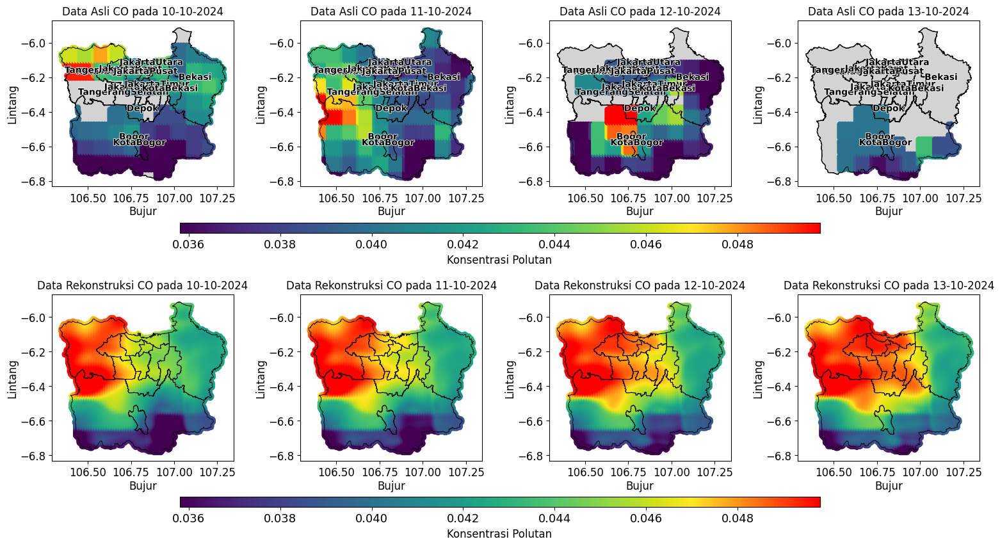

In [ ]:
# @title
# --- Step 5: Setup figure---
fig, axes = plt.subplots(2, len(day_offsets), figsize=(5 * len(day_offsets), 8))
if len(day_offsets) == 1:
    axes = axes.reshape(2, 1)  # Ensure axes is always 2D

mappables = {"Data Asli": None, "Data Rekonstruksi": None}

for row_idx, day_offset in enumerate(day_offsets):
    time_to_visualize = t + day_offset
    date_label = (target_date + timedelta(days=day_offset)).strftime('%d-%m-%Y')

    for col_idx, (source_df, label) in enumerate([(df, "Data Asli"), (predict, "Data Rekonstruksi")]):
        ax = axes[col_idx][row_idx]

        df_visualize = source_df[source_df['time'] == time_to_visualize].copy()
        if df_visualize.empty:
            ax.set_title(f"No data for {label} t+{day_offset} ({date_label})", fontsize=12)
            ax.axis('off')
            continue

        geometry = [Point(xy) for xy in zip(df_visualize['x_coord'], df_visualize['y_coord'])]
        gdf = gpd.GeoDataFrame(df_visualize, geometry=geometry)
        merged_gdf = gpd.sjoin(gdf, jawa, how="inner", predicate="within")

        jawa.plot(ax=ax, color='lightgray', edgecolor='black')
        jawa.boundary.plot(ax=ax, color='black', linewidth=0.7)

        if not merged_gdf.empty:
            mappable = merged_gdf.plot(
                column='CO_mean', ax=ax,
                cmap=viridis_to_red, vmin=vmin, vmax=vmax
            )
            mappables[label] = mappable

        # City names
        if label == "Data Asli":
          for idx, row in jawa.iterrows():
              ax.annotate(
                  text=row['NAME_2'],
                  xy=(row['centroid'].x, row['centroid'].y),
                  ha='center', fontsize=10, color='black', weight='bold',
                  path_effects=[pe.withStroke(linewidth=1.2, foreground="white")]
              )

        ax.set_title(f"{label} CO pada {date_label}", fontsize=12, pad=6)
        ax.set_xlabel("Bujur", fontsize=12, labelpad=2)
        ax.set_ylabel("Lintang", fontsize=12, labelpad=2)
        ax.tick_params(axis='both', which='major', labelsize=12)

# Create separate colorbars for each row
cbar_ax1 = fig.add_axes([0.25, 0.535, 0.5, 0.02])
cbar_ax2 = fig.add_axes([0.25, 0.0, 0.5, 0.02])

sm1 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar1 = fig.colorbar(sm1, cax=cbar_ax1, orientation="horizontal")
cbar1.set_label("Konsentrasi Polutan", fontsize=12)
cbar1.ax.tick_params(labelsize=13)

sm2 = mpl.cm.ScalarMappable(cmap=viridis_to_red, norm=mpl.colors.Normalize(vmin=vmin, vmax=vmax))
cbar2 = fig.colorbar(sm2, cax=cbar_ax2, orientation="horizontal")
cbar2.set_label("Konsentrasi Polutan", fontsize=12)
cbar2.ax.tick_params(labelsize=13)

plt.subplots_adjust(wspace=0.01, hspace=0.65, bottom=0.09, top=0.95)
plt.show()
